In [1]:
#install.packages(c("dplyr","TSstudio","forecast","tidyr"))

In [2]:
library(dplyr)
library(TSstudio)
library(forecast)
library(tidyr)
library(plotly)
library(ggplot2)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 

Registered S3 methods overwritten by 'forecast':
  method             from    
  fitted.fracdiff    fracdiff
  residuals.fracdiff fracdiff

Loading required package: ggplot2


Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout




In [3]:
data <- read.csv("input.csv")
head(data)

X,Scenario,Product,Sub.Product,Date,Volumes
0,Field Ops - Mass Markets - Test 7/7/2021,SOUTHWEST,AZ,20201201,34786
1,Field Ops - Mass Markets - Test 7/7/2021,EAST,NORTHEAST,20190101,44454
2,Field Ops - Mass Markets - Test 7/7/2021,EAST,FL_TX,20191001,48903
3,Field Ops - Mass Markets - Test 7/7/2021,NORTHERN,HEARTLAND,20200801,39536
4,Field Ops - Mass Markets - Test 7/7/2021,NORTHERN,WA_MT,20210401,19653
5,Field Ops - Mass Markets - Test 7/7/2021,NORTHERN,HEARTLAND,20190801,44817


In [4]:
data[1] <- NULL
head(data)

Scenario,Product,Sub.Product,Date,Volumes
Field Ops - Mass Markets - Test 7/7/2021,SOUTHWEST,AZ,20201201,34786
Field Ops - Mass Markets - Test 7/7/2021,EAST,NORTHEAST,20190101,44454
Field Ops - Mass Markets - Test 7/7/2021,EAST,FL_TX,20191001,48903
Field Ops - Mass Markets - Test 7/7/2021,NORTHERN,HEARTLAND,20200801,39536
Field Ops - Mass Markets - Test 7/7/2021,NORTHERN,WA_MT,20210401,19653
Field Ops - Mass Markets - Test 7/7/2021,NORTHERN,HEARTLAND,20190801,44817


In [5]:
# Data Manipulation

# Remove the Unassigned Prod/Subproduct
data <-data[!grepl("UNASSIGNED", data$Sub.Product),]

# Change the date column into a ymd format
data$Date <- as.character(data$Date) %>%
  lubridate::ymd()

# Remove all dates from August 2021 and later (SHOULD BE CHANGED AS)
data <- data %>% filter(Date < "2021-08-01")

# Combine product and subproduct columns, because code is based off unique subproduct
data$product_subproduct <- paste(data$Product, data$Sub.Product,sep="_and_")

# Remove Product and subproduct column, since we already created a combined column
data <- data[ , -which(names(data) %in% c("Product","Sub.Product"))]
    
# Keep product_subproduct with 22 observations or more
data<-data %>%
     group_by(product_subproduct) %>%
     filter(n() >= 22) %>%
     ungroup

# Find the max date for both scenarios, then take the minimum of the x amount of scenarios
data %>%
   group_by(Scenario) %>%
   slice_max(n = 1, order_by = Date) %>%
   ungroup %>%
   pull(Date) %>%
   min -> Min_date

# Fill with 0's from lowest date to our new max date
data <-data %>%
  complete(Date = seq.Date(from = min(Date), to = as.Date(Min_date), by = 'month'), 
           nesting(Scenario,product_subproduct), fill = list(Volumes = 0))

# Impute the mean from Jan 2019 to Dec 2020
data <- data %>%
     group_by(product_subproduct)  %>%
     mutate(Volumes = replace(Volumes, Volumes == 0, 
         mean(Volumes[Volumes != 0  & 
    between(Date, as.Date("2019-01-01"), as.Date("2020-12-01"))], 
         na.rm = TRUE))) 

# I have 0's for any months missing up to Dec 2022 (format to export later)
data <- dplyr::group_by(data,data$Scenario) %>%
  complete(Date = seq.Date(from = max(Date), to = as.Date('2022-12-01'), by = 'month'), 
           nesting(Scenario,product_subproduct), fill = list(Volumes = 0))

# Organize the data by date and product_subproduct
data <- dplyr::arrange(data,data$Date)
data <- dplyr::arrange(data,data$product_subproduct)
data <- dplyr::ungroup(data)
data <- data[ -c(1) ]

# Arrange scenario and automatically subset data by unique scenario
data <- dplyr::arrange(data,data$Scenario)
un1 <- unique(data$Scenario)
for(i in seq_along(un1)) 
     assign(paste0('scenario', i), subset(data, Scenario == un1[i]))

In [6]:
# Data should be Date/Scenario/Product_Subproduct/Volumes (4 columns at this point)
export_df_s1 <- split(scenario1[1:4], scenario1[3])

 # Creation of data frames based off UNIQUE Sub.ProductS 
dummy_list_s1 <- split(scenario1[1:4], scenario1[3]) %>% lapply( function(x) x[(names(x) %in% c("Date", "Volumes"))])
dummy_list_s1 <-  lapply(dummy_list_s1, function(x) { x["Date"] <- NULL; x })

list_dfs_s1 <- list()
for (i in 1:length(unique(scenario1$product_subproduct))) {
  list_dfs_s1 <-append(list_dfs_s1,dummy_list_s1[[i]])
}

combined_dfs_s1 <- Reduce(function(x, y) merge(x, y, all = TRUE,  by='Date'), list(list_dfs_s1))

# List of time series for scenario1
list_ts_s1 <- lapply(list_dfs_s1, function(t) ts(t,start=c(2019,1),end=c(2021,5), frequency = 12)) %>%
                  lapply( function(t) ts_split(t,sample.out=(5)))    # creates my train test split
list_ts_s1 <- do.call("rbind", list_ts_s1)  #Creates a list of time series                         

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


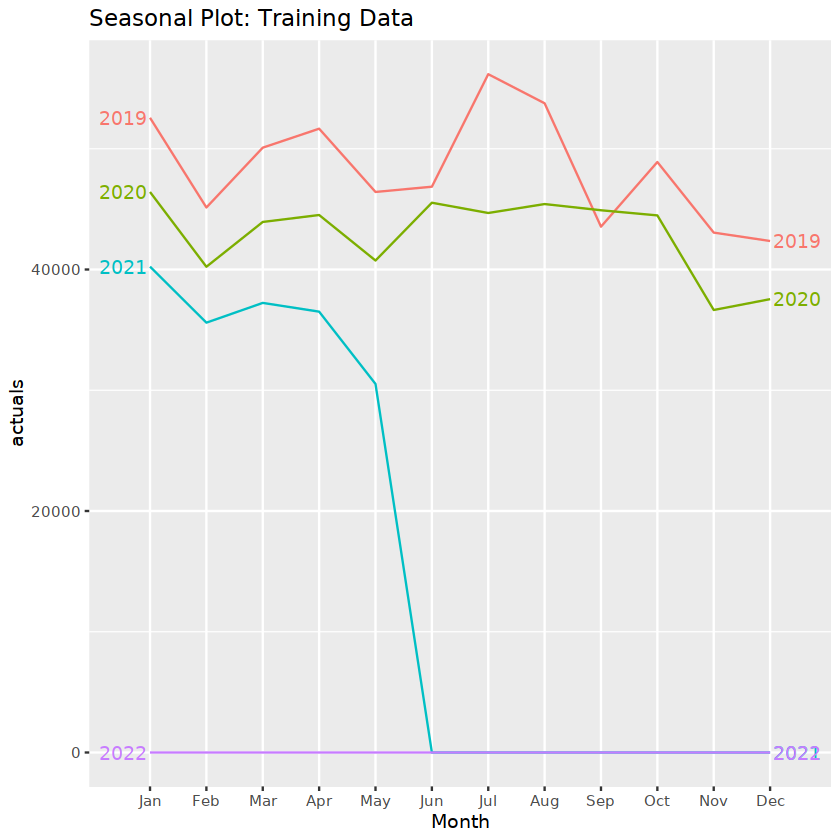

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


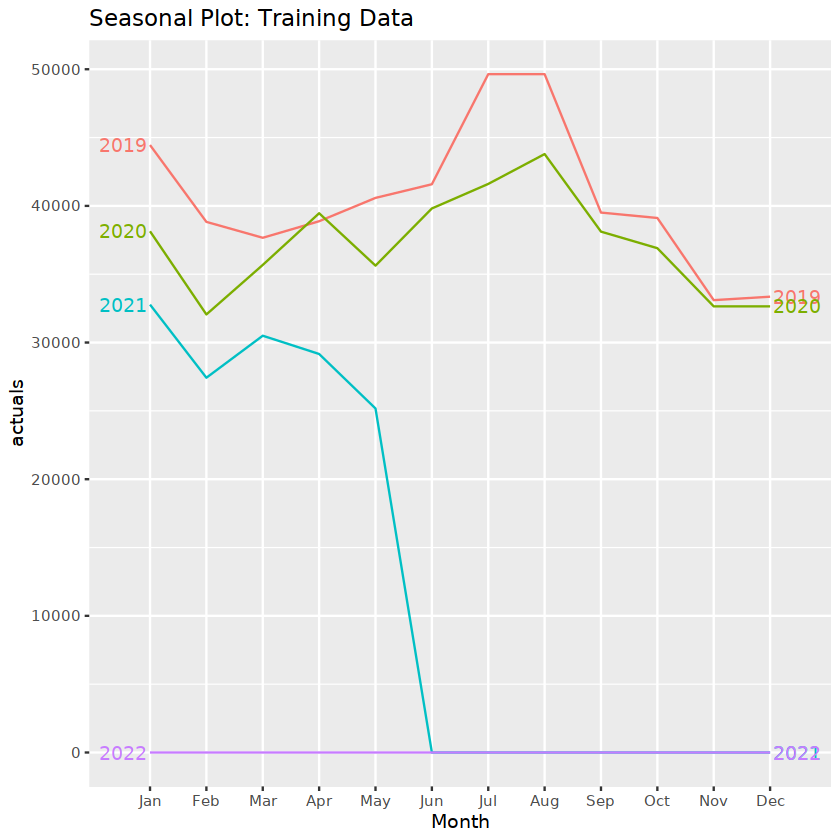

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


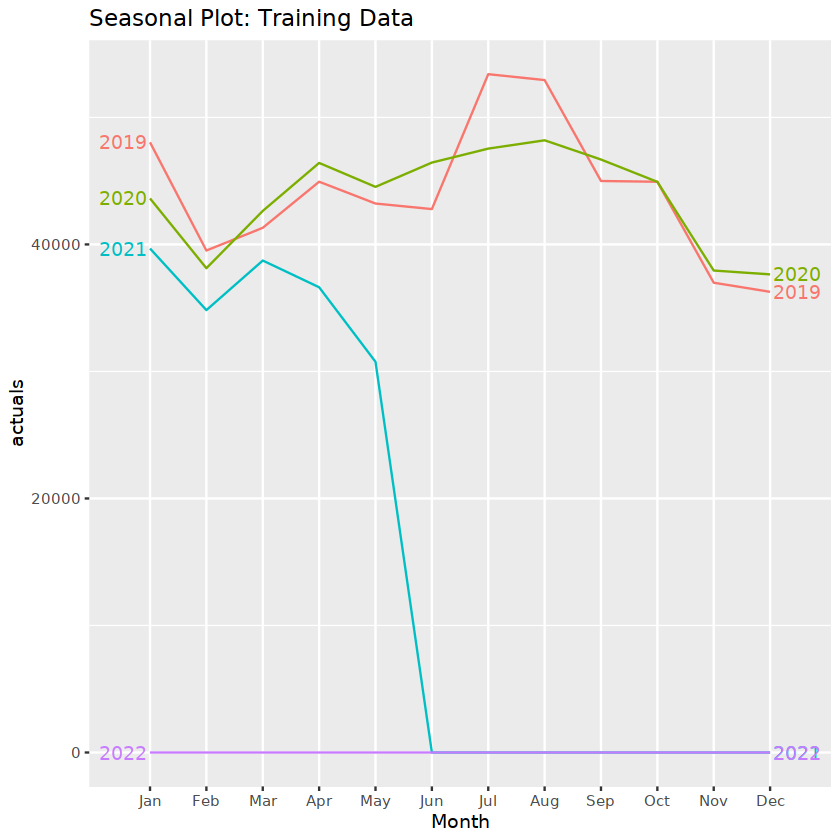

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


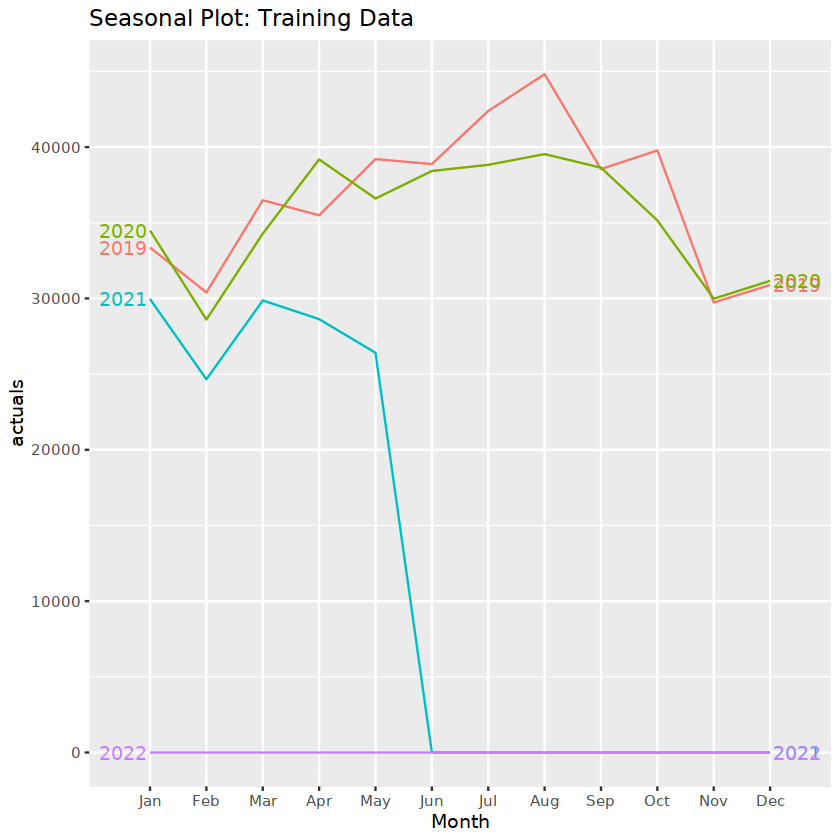

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


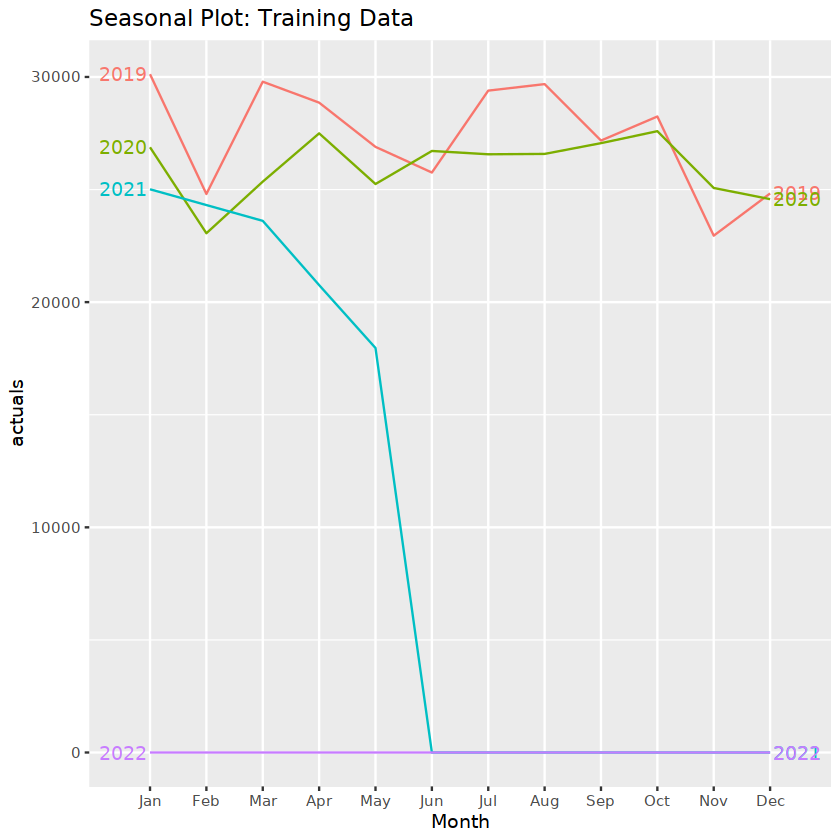

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


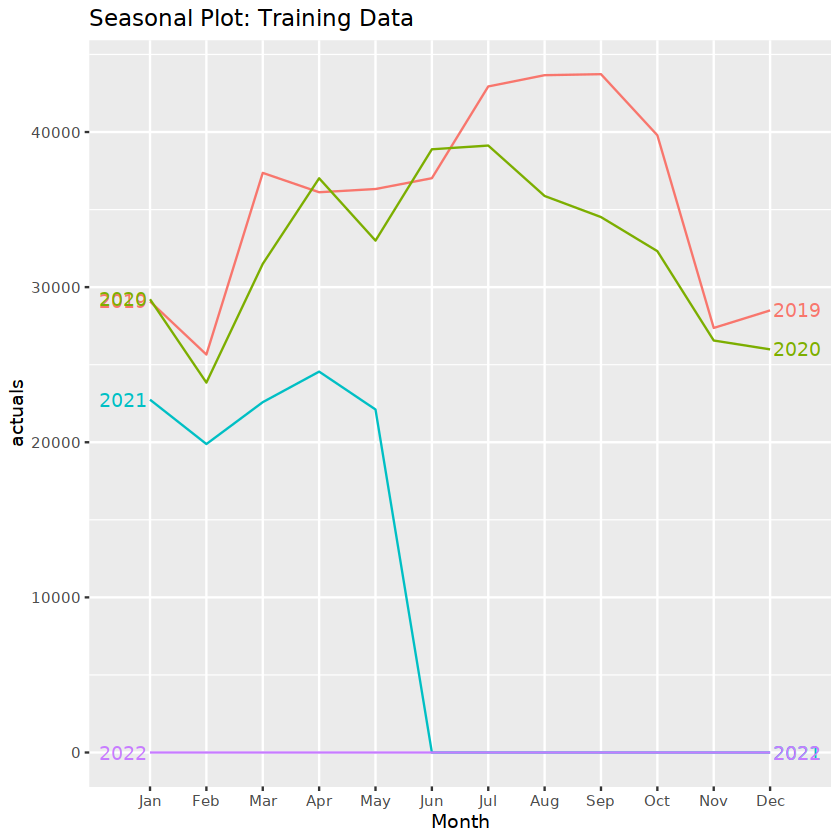

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


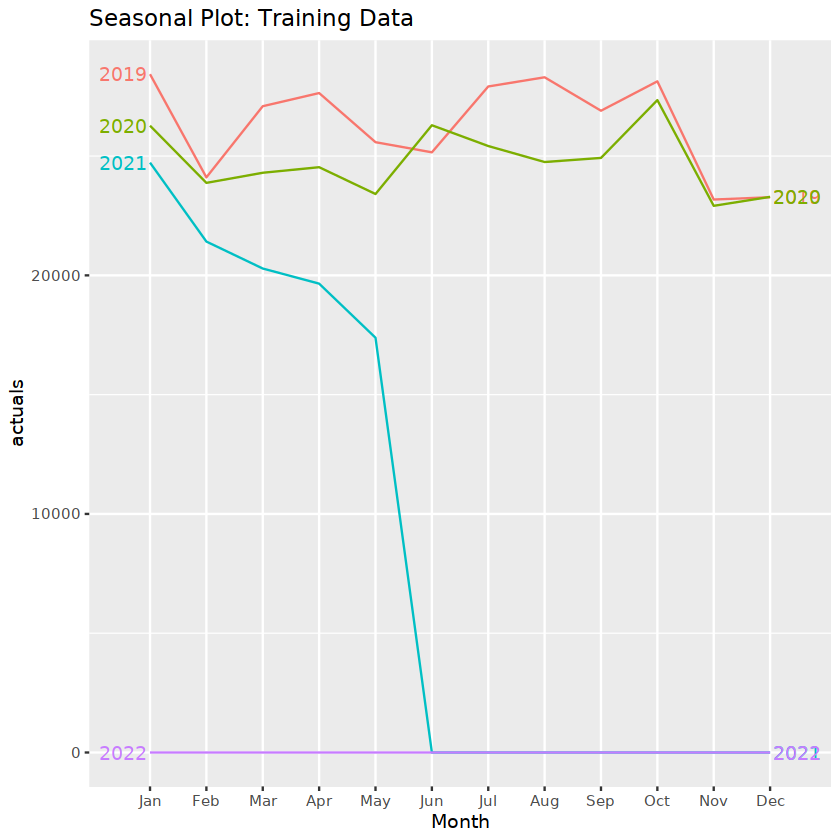

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


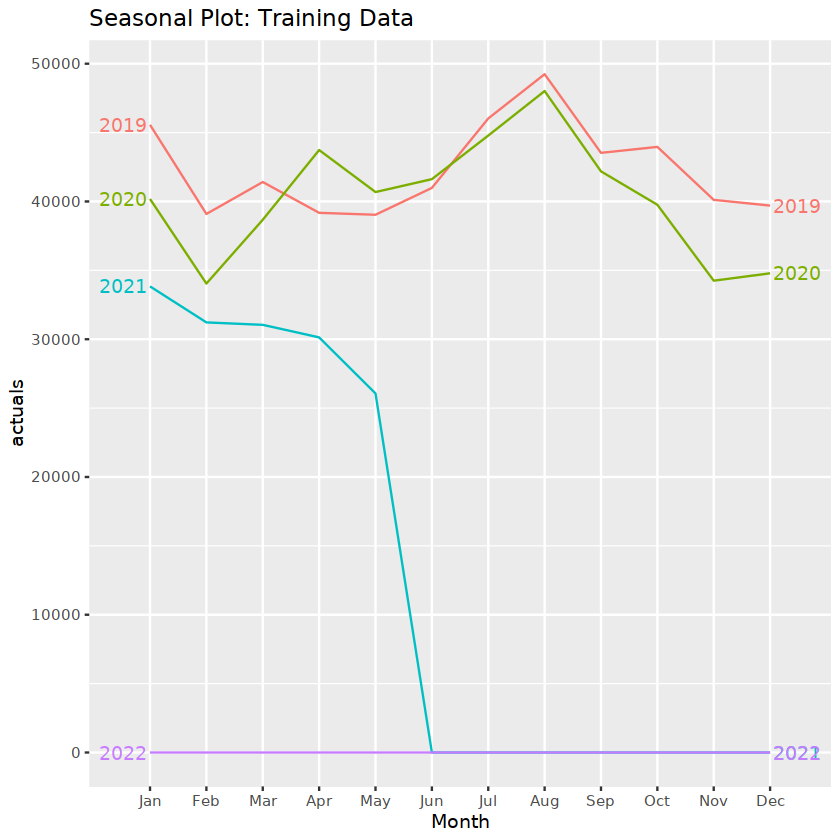

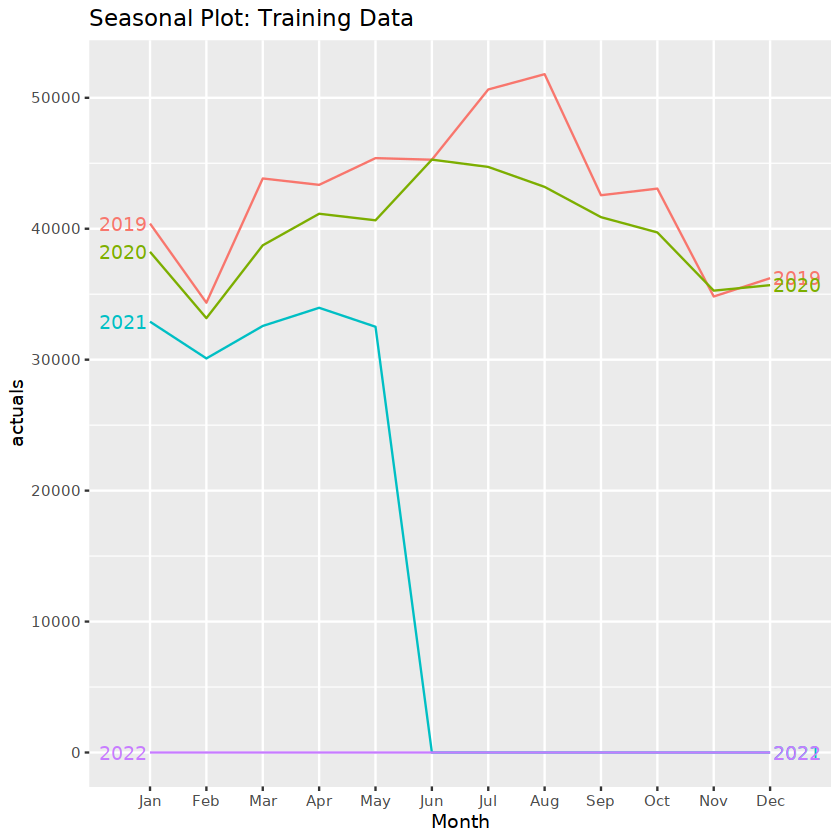

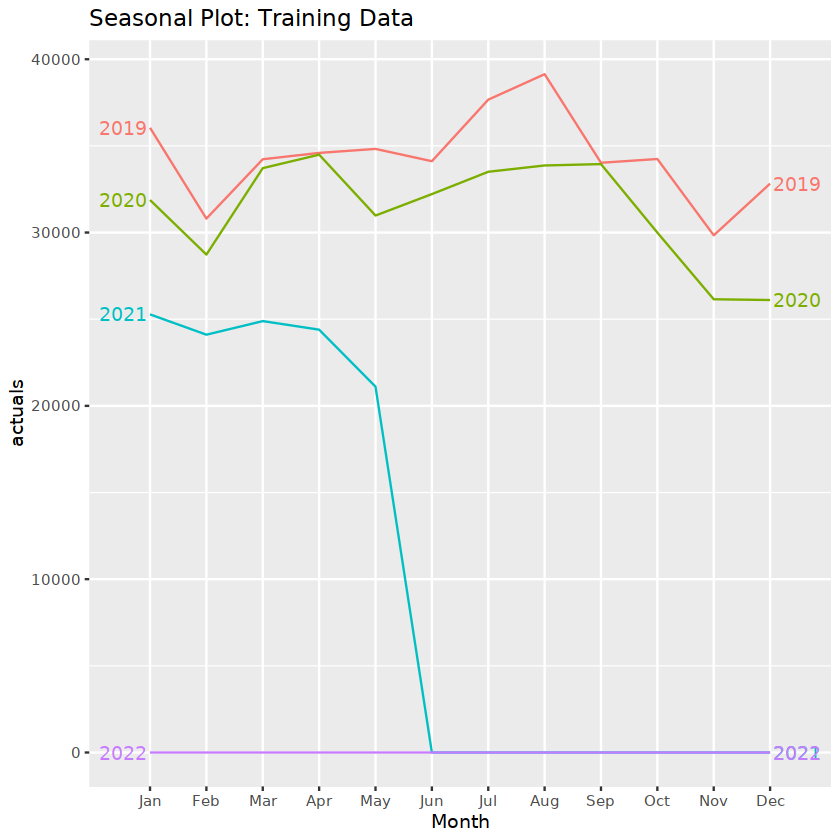

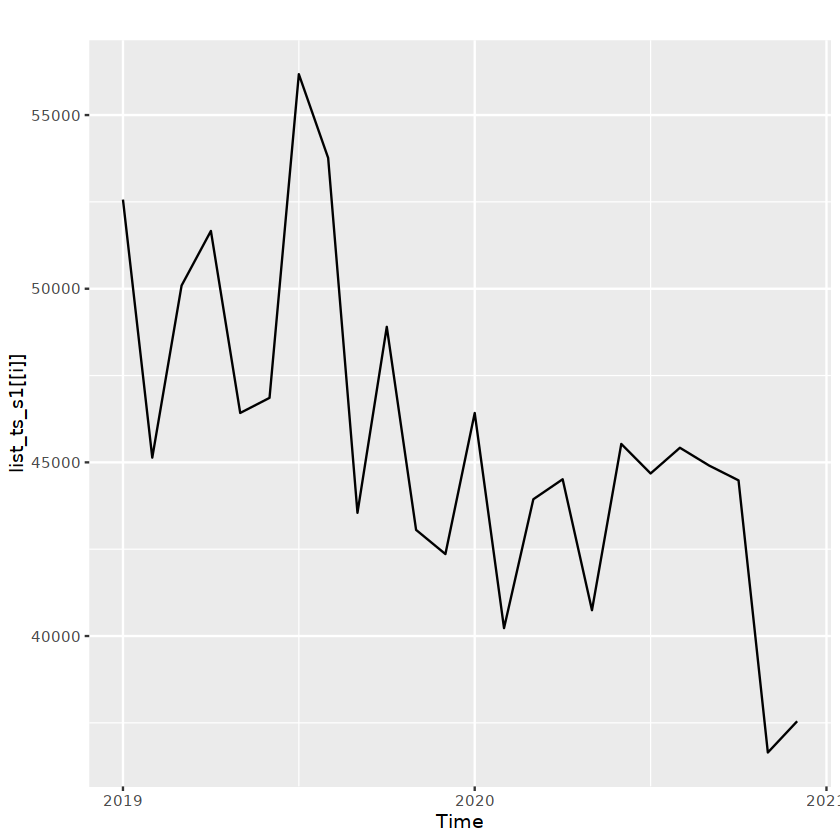

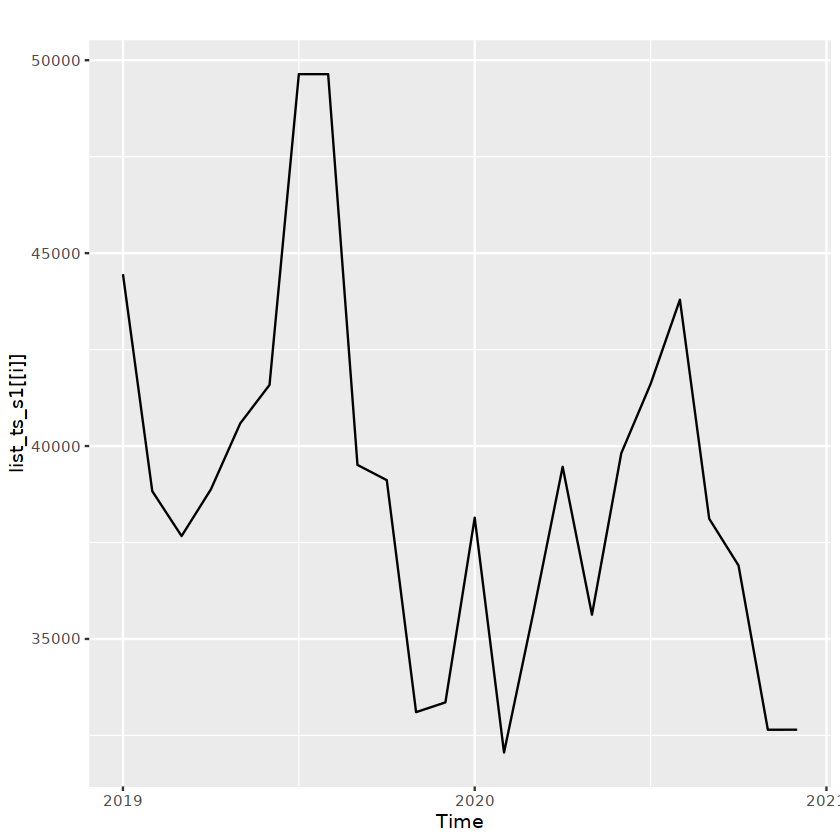

...

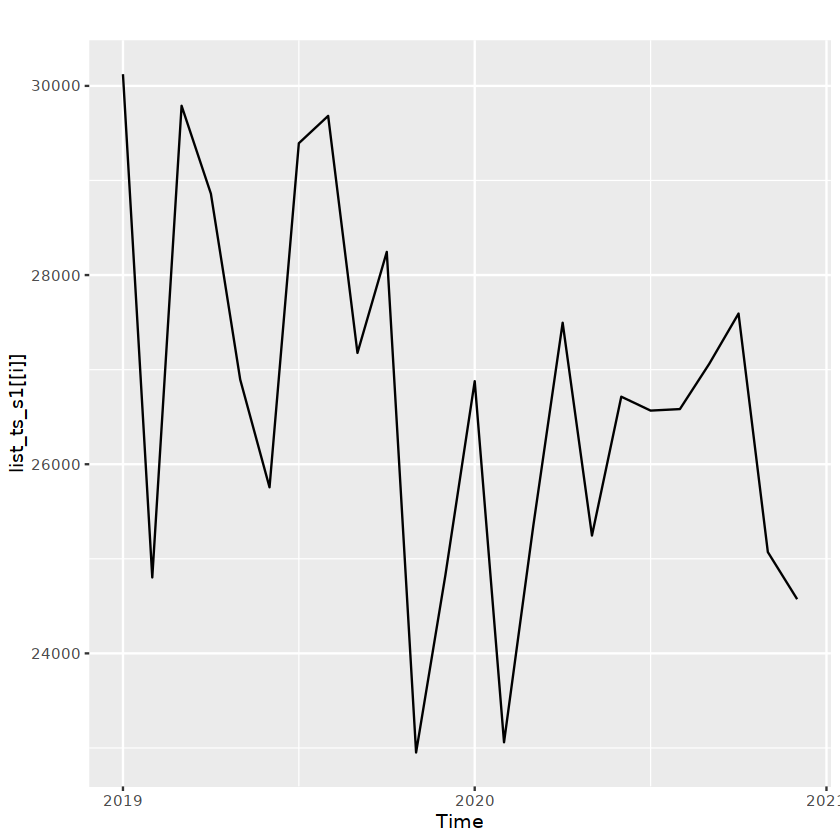

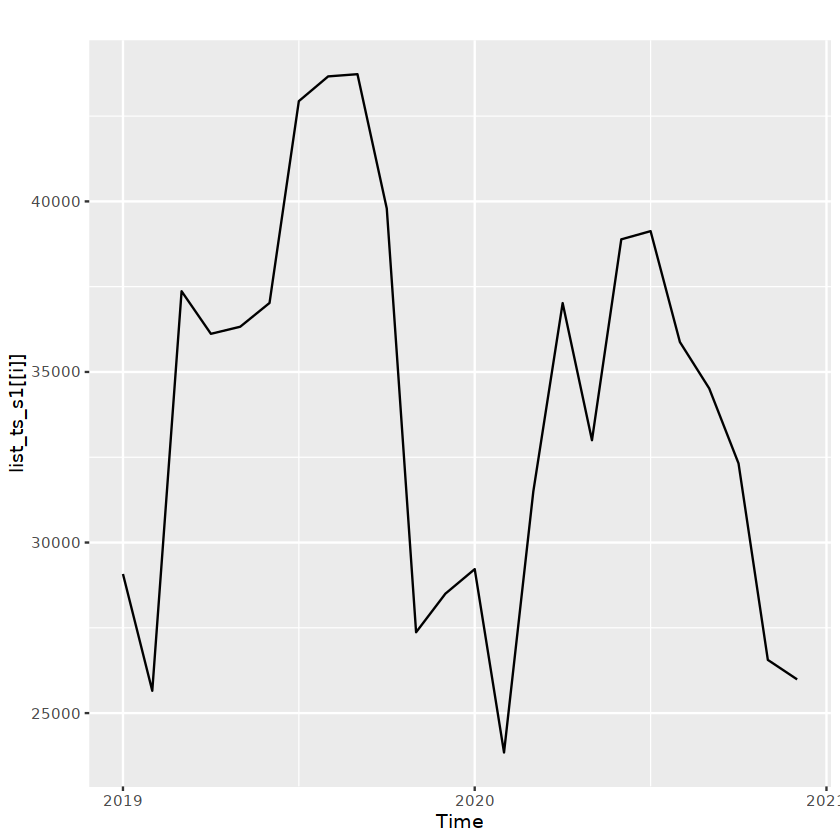

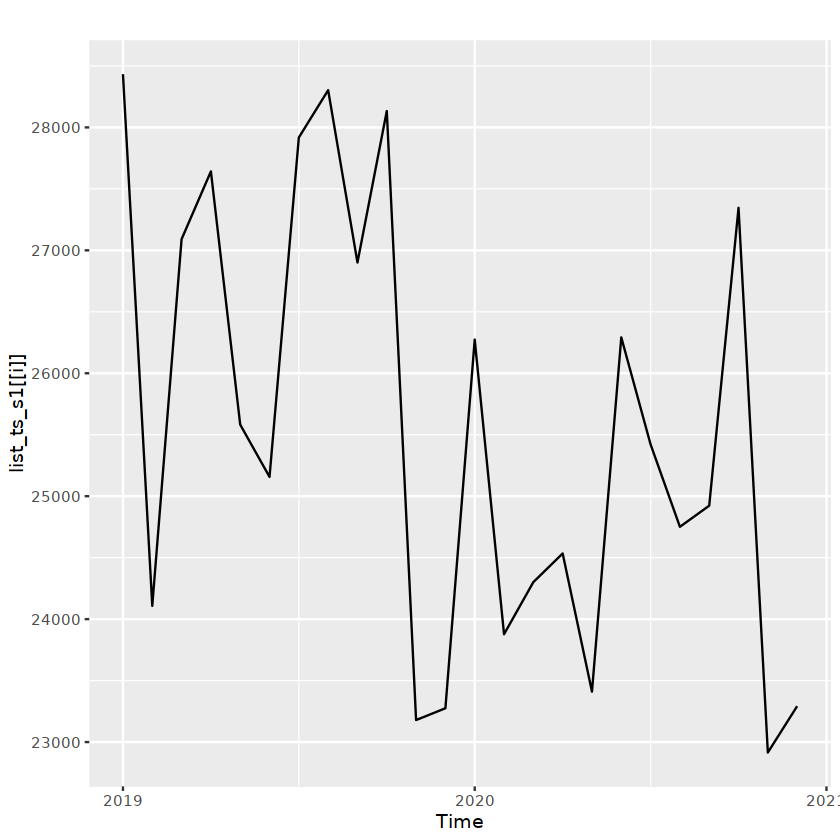

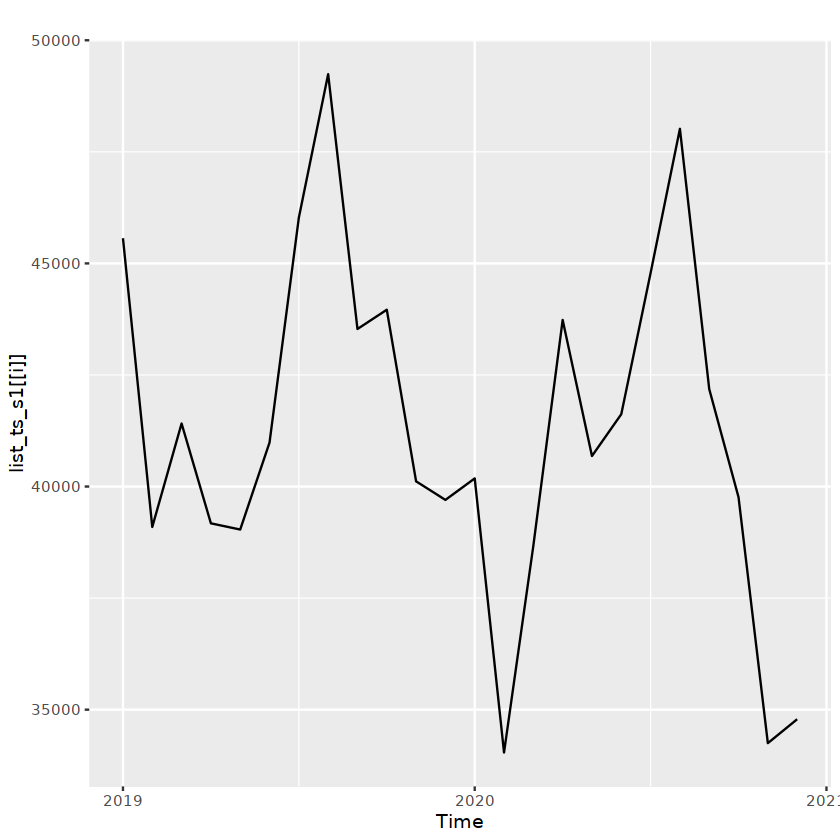

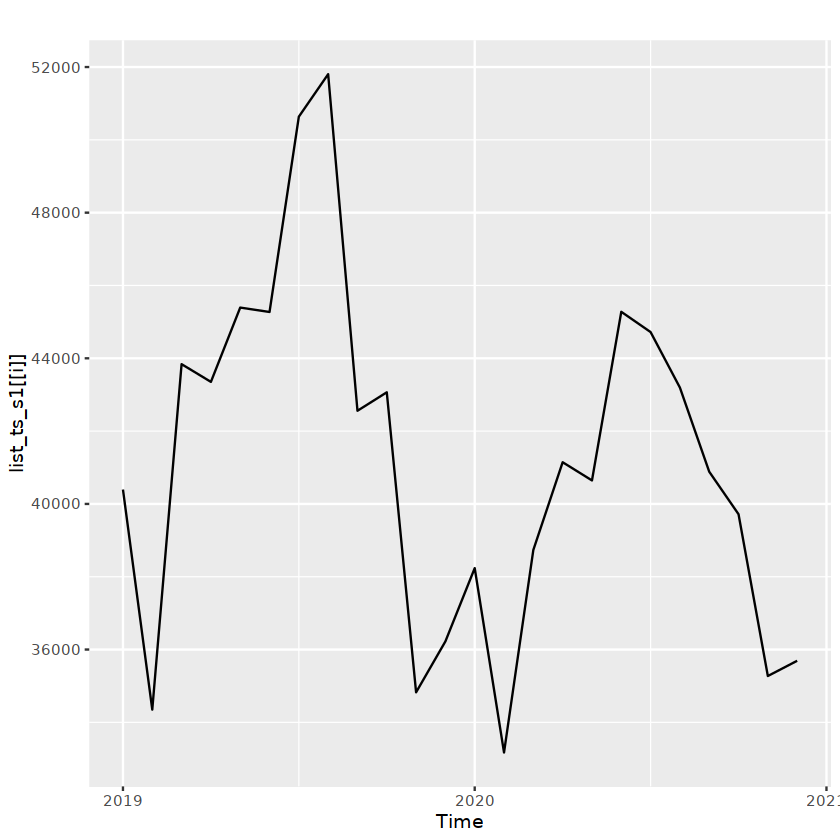

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


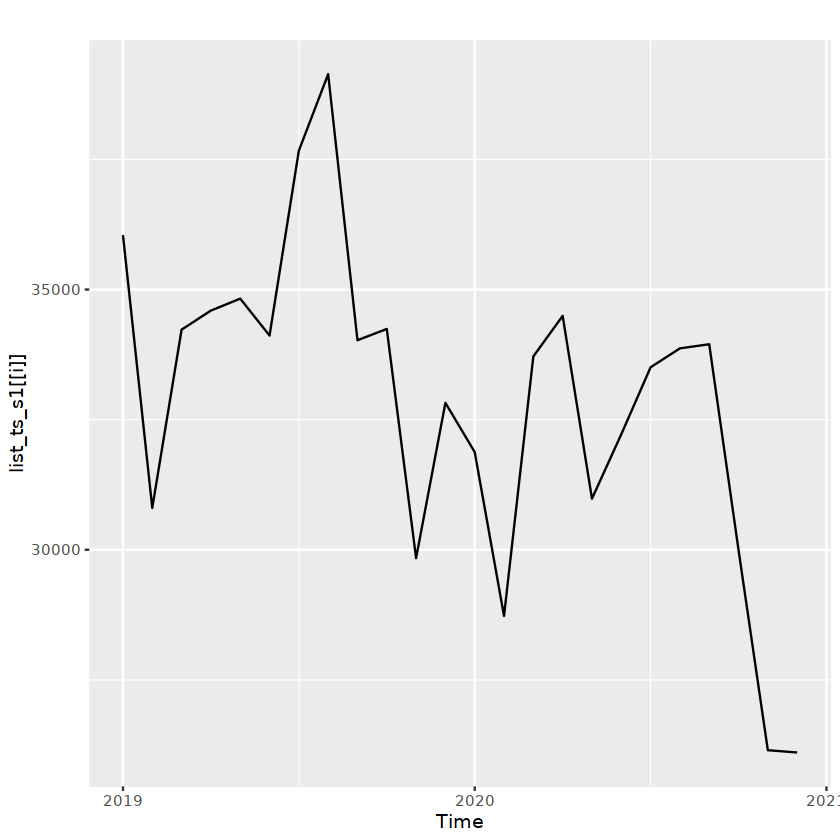

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


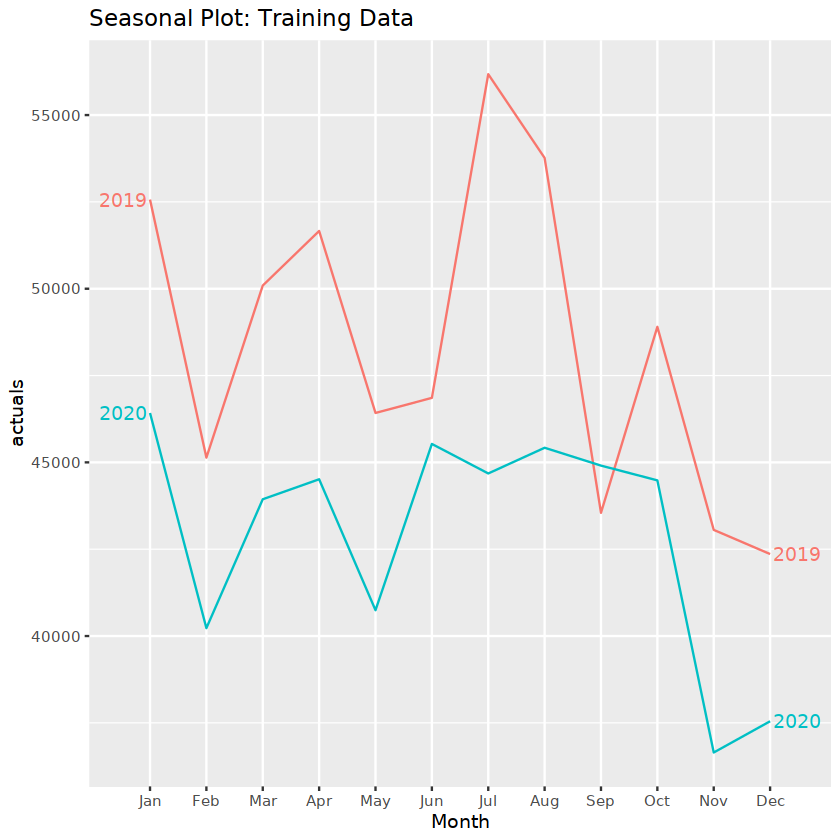

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


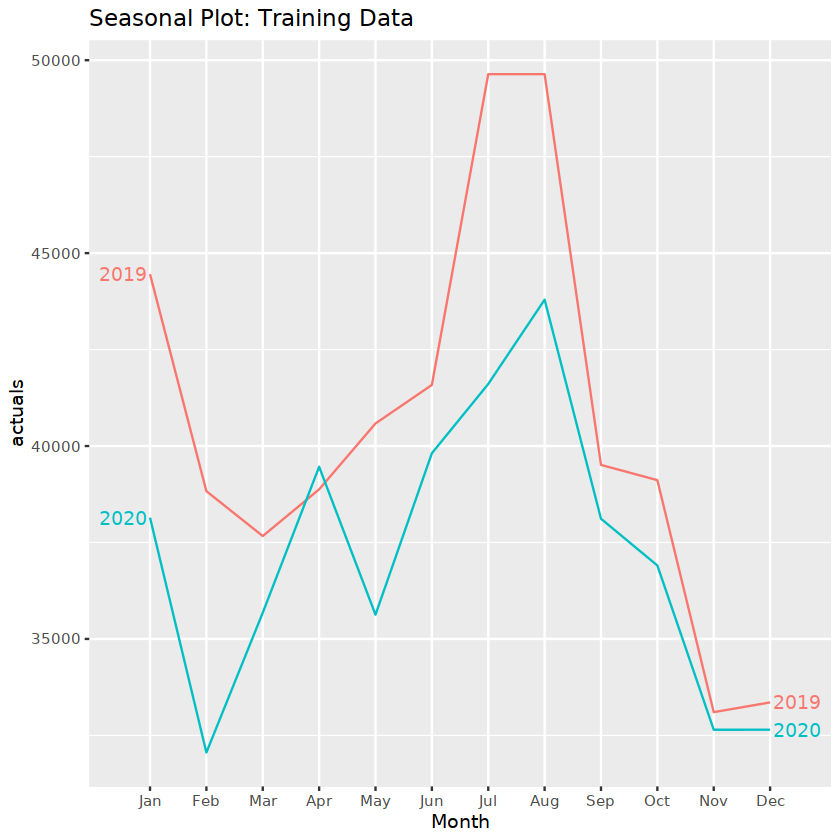

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


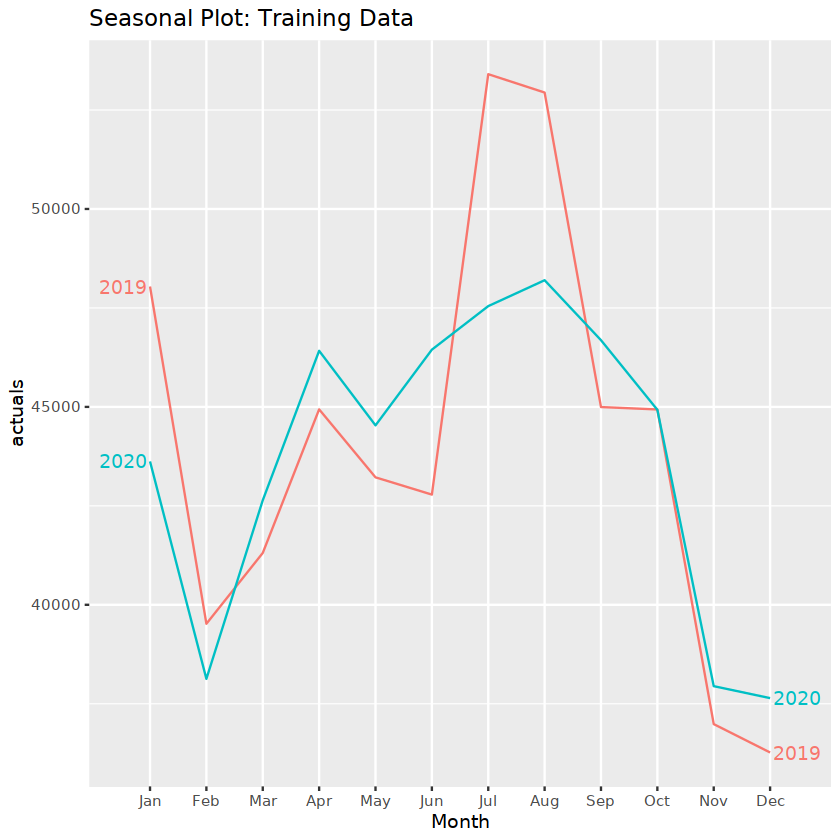

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


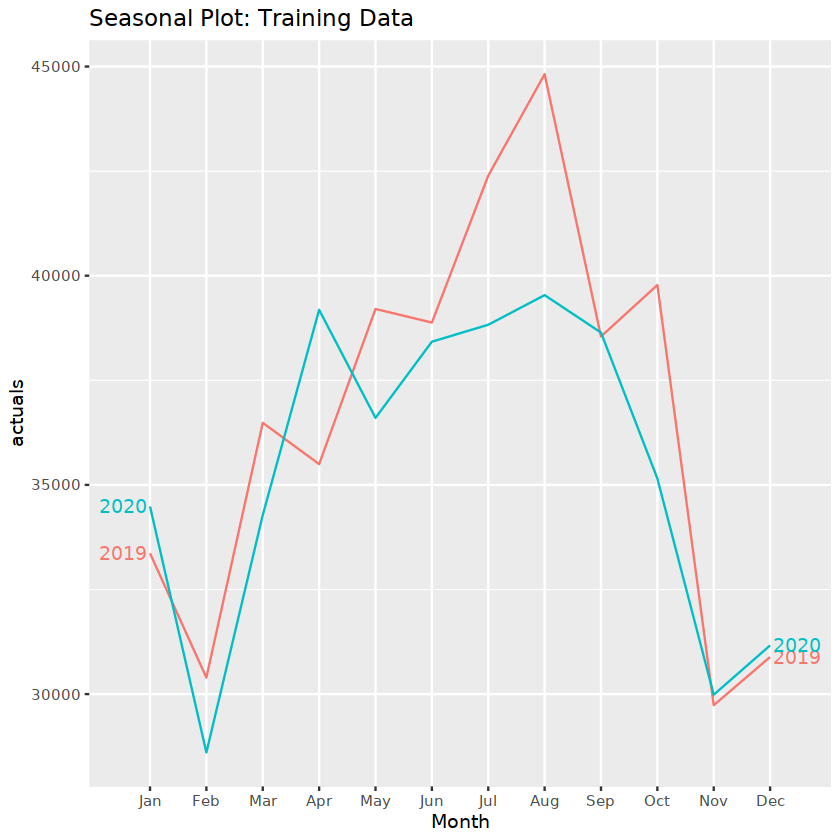

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


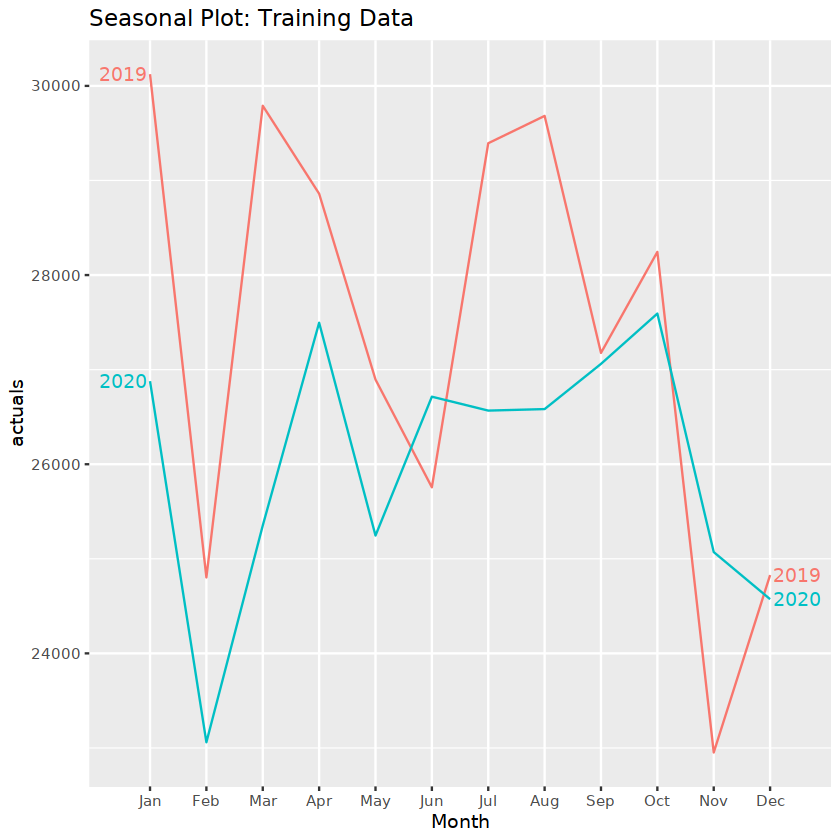

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


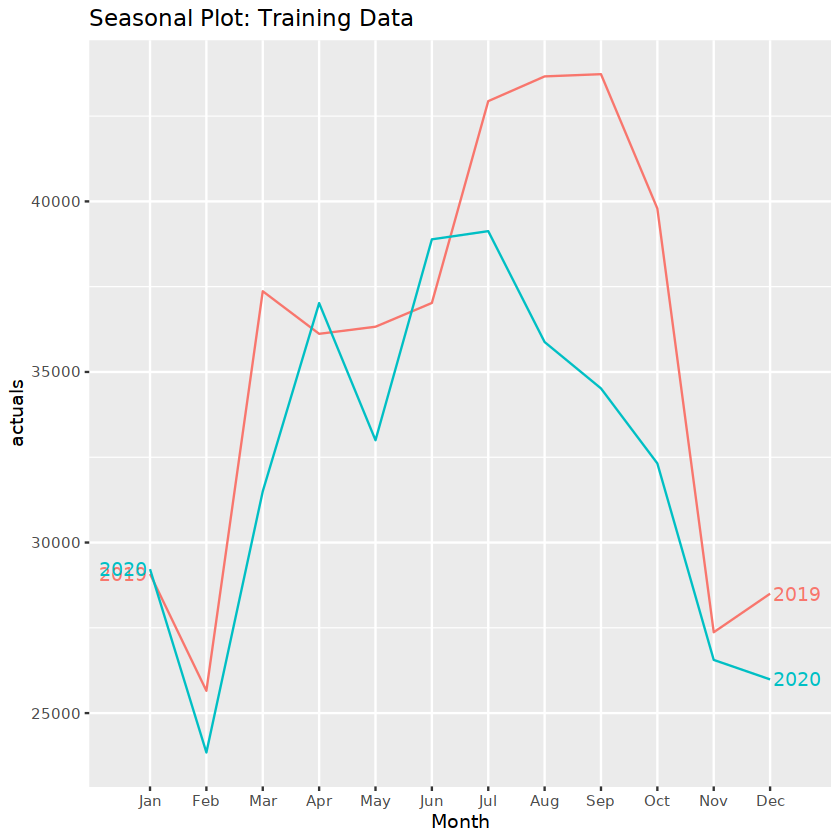

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


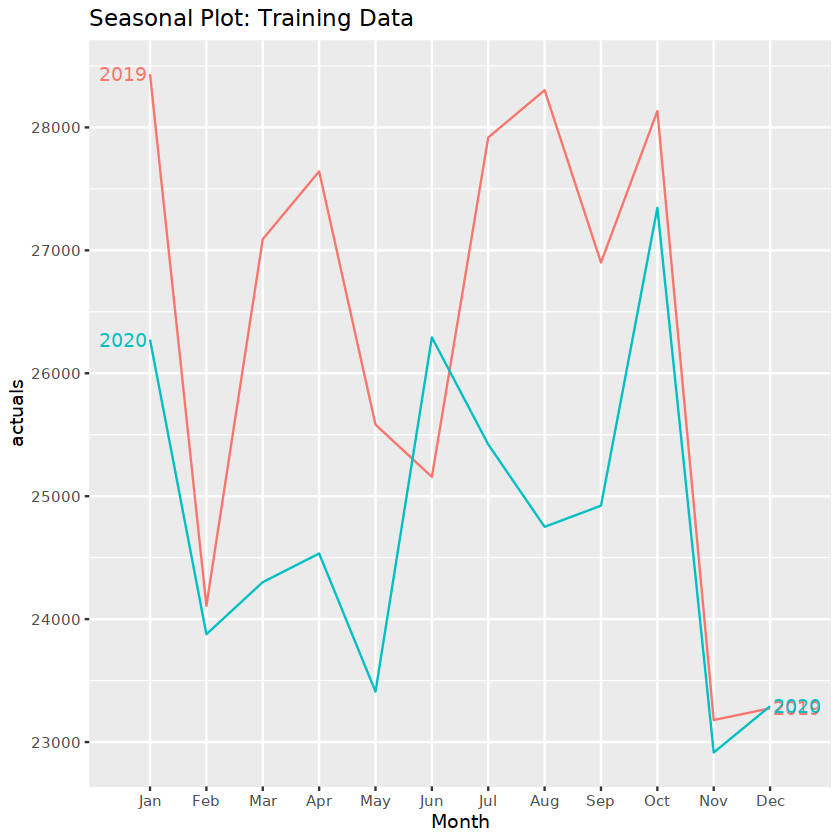

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


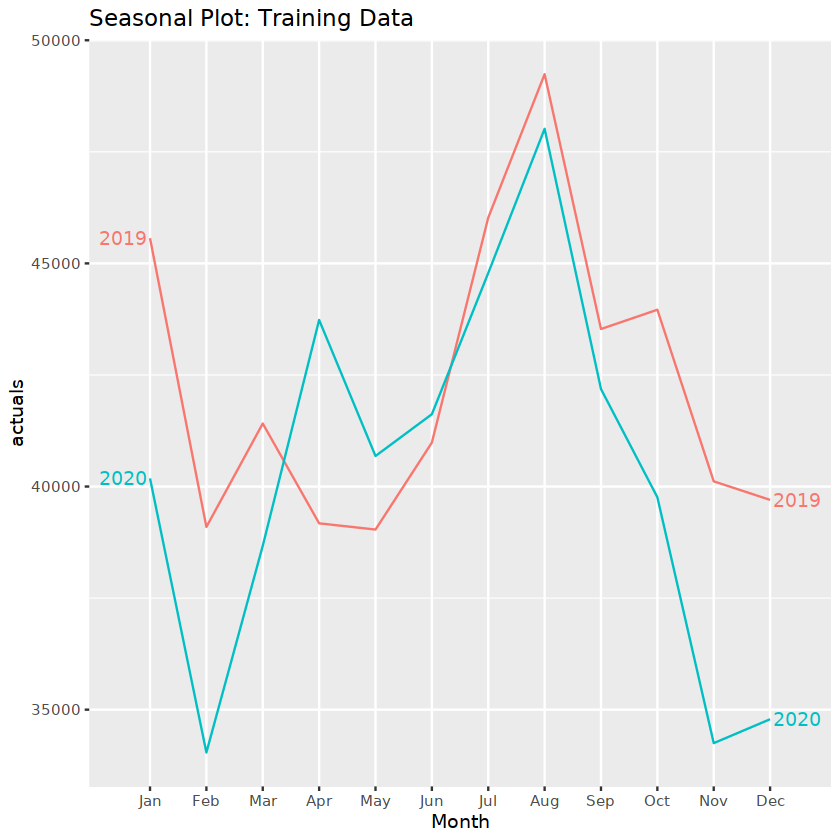

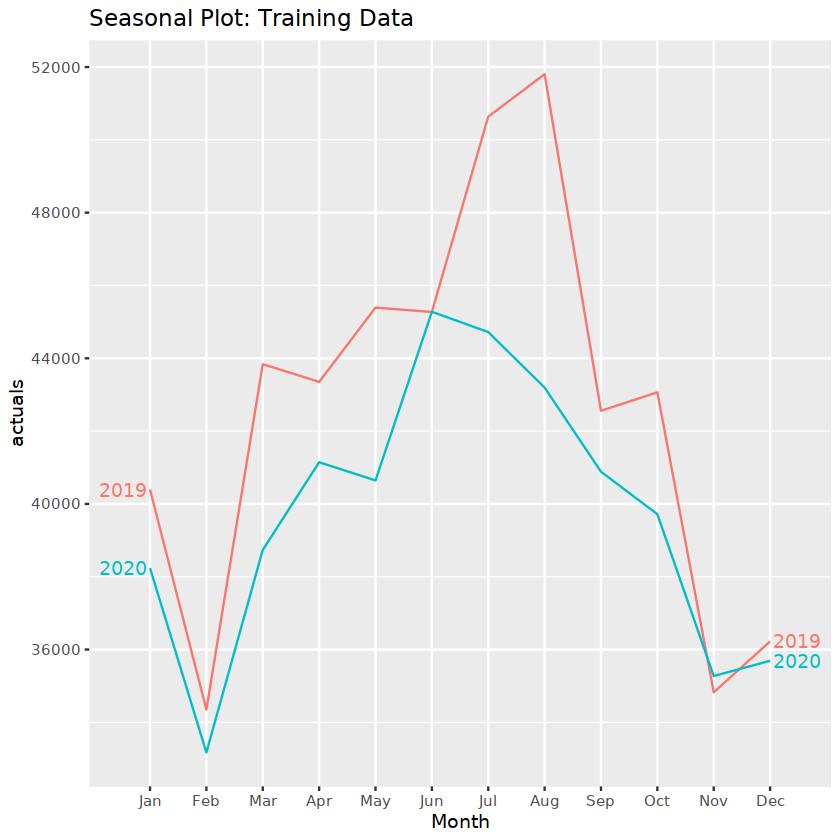

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



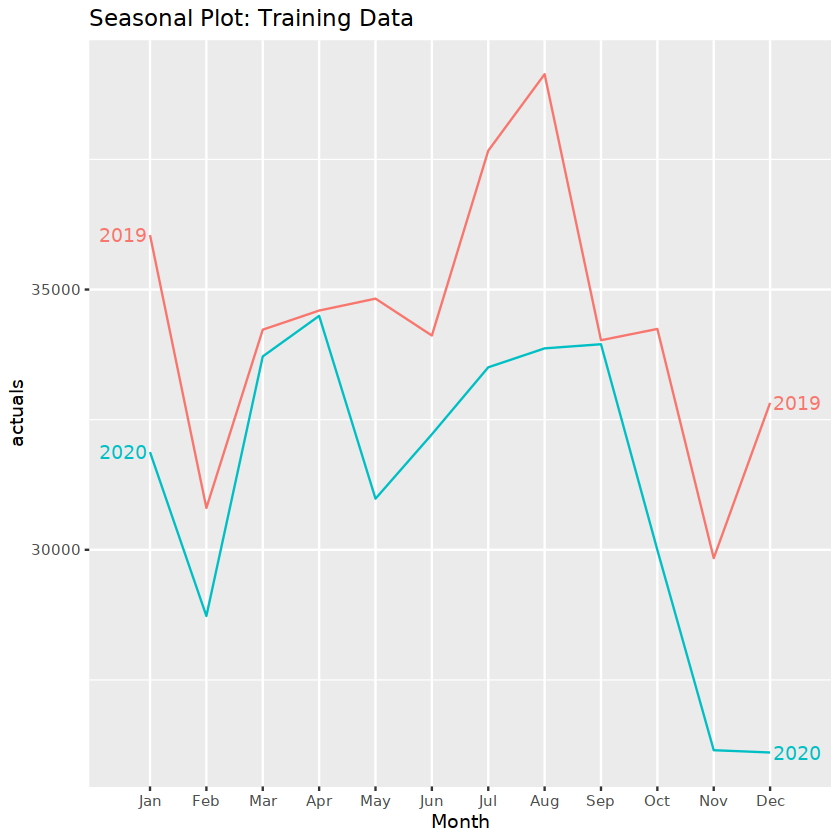

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



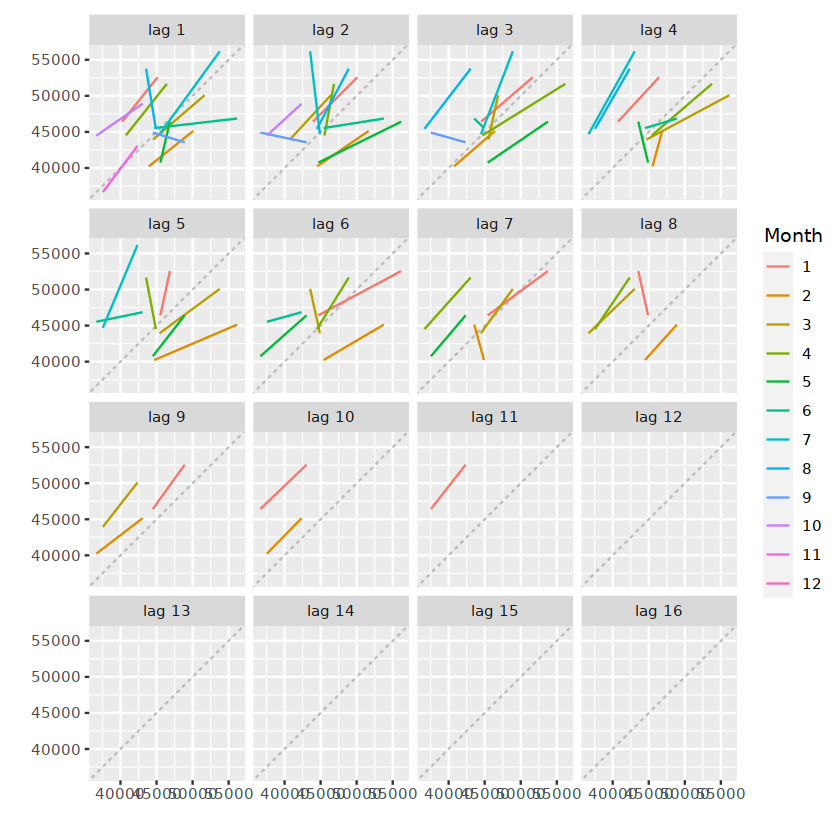

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



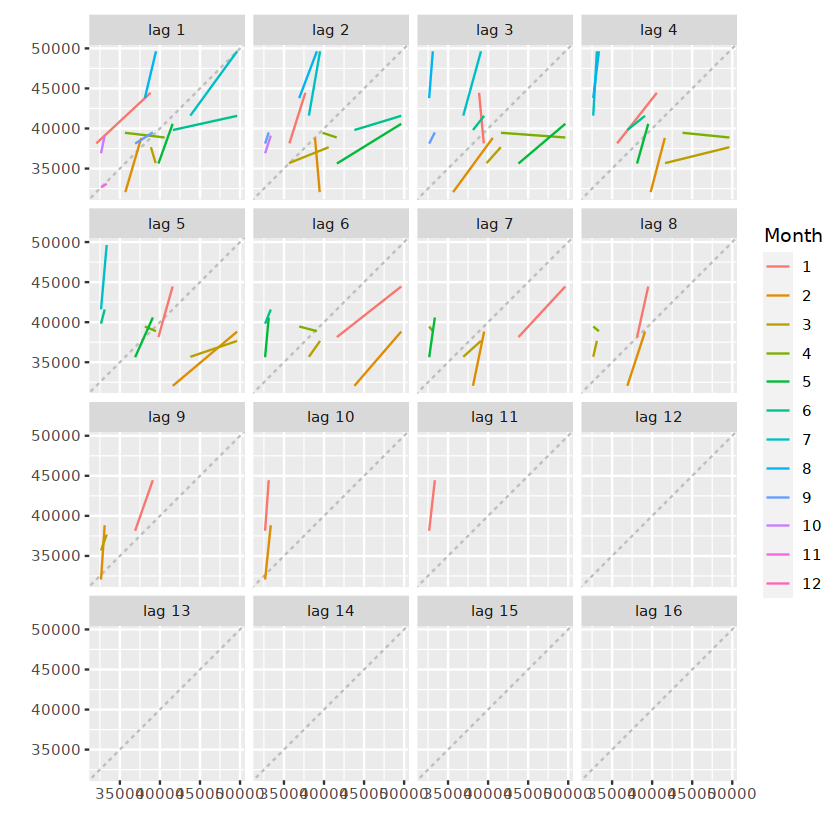

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



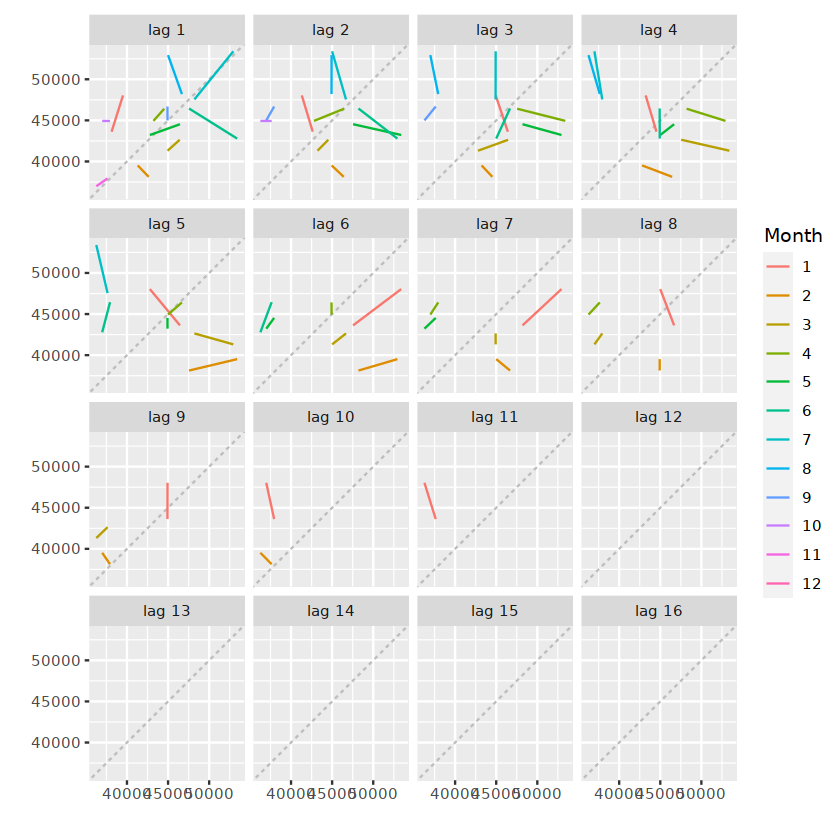

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



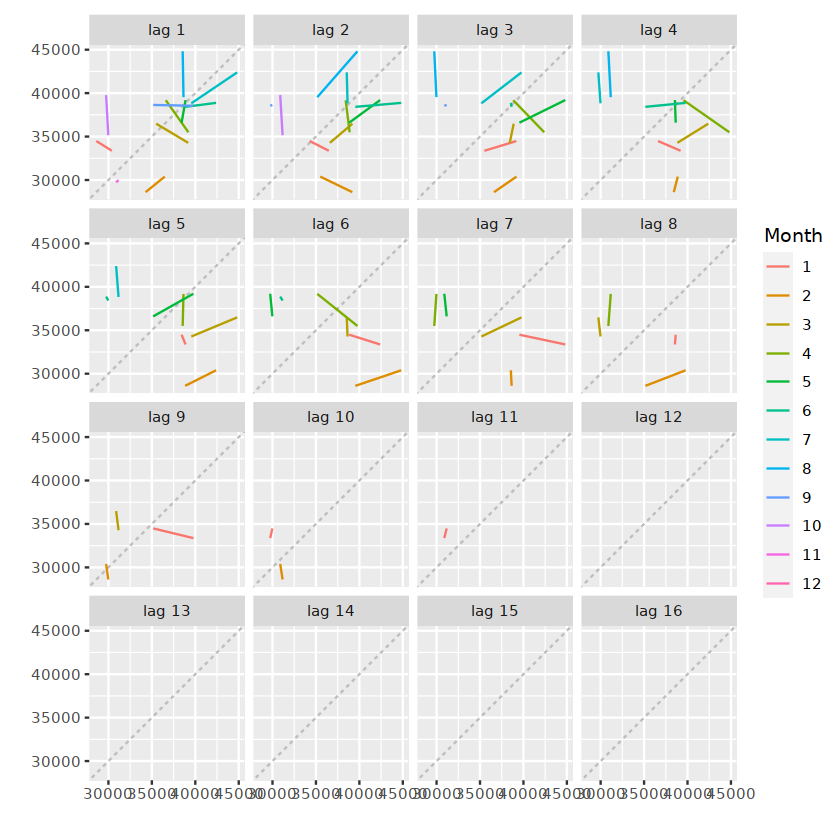

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



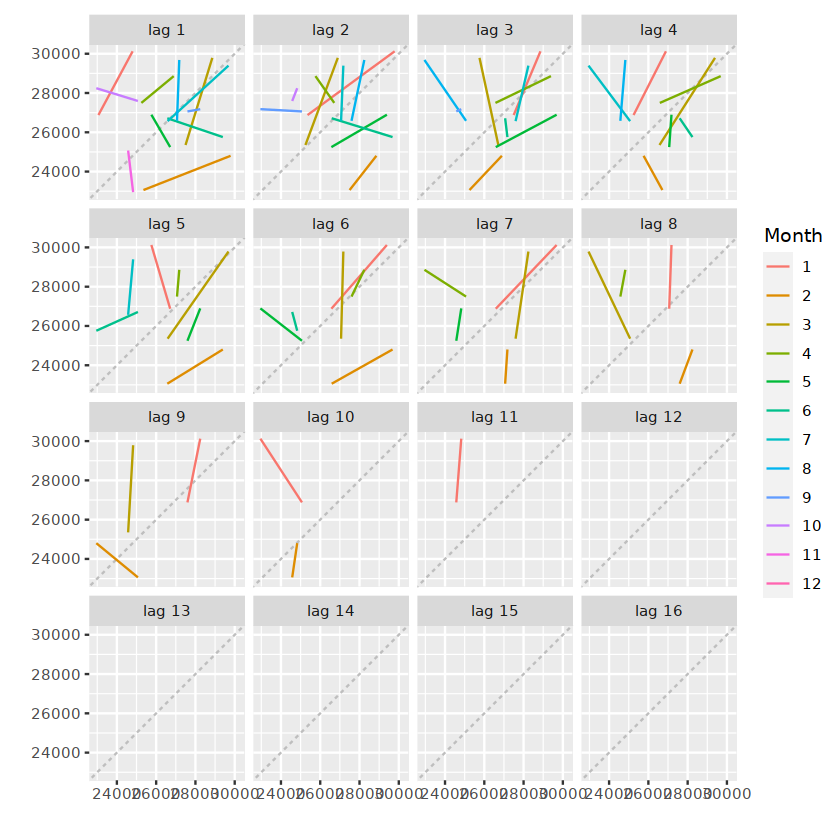

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



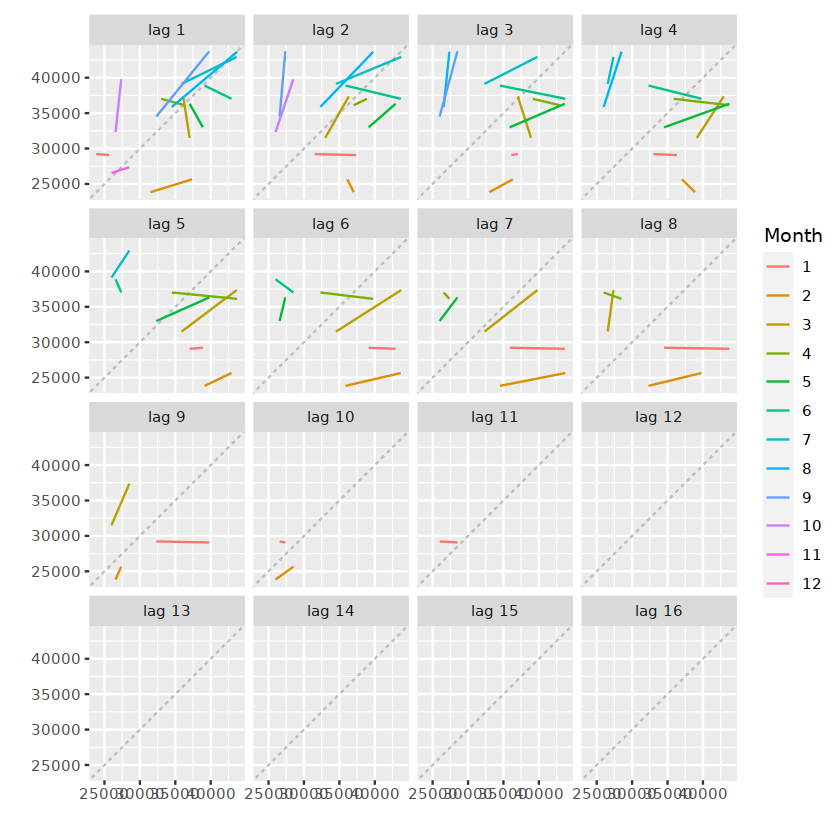

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



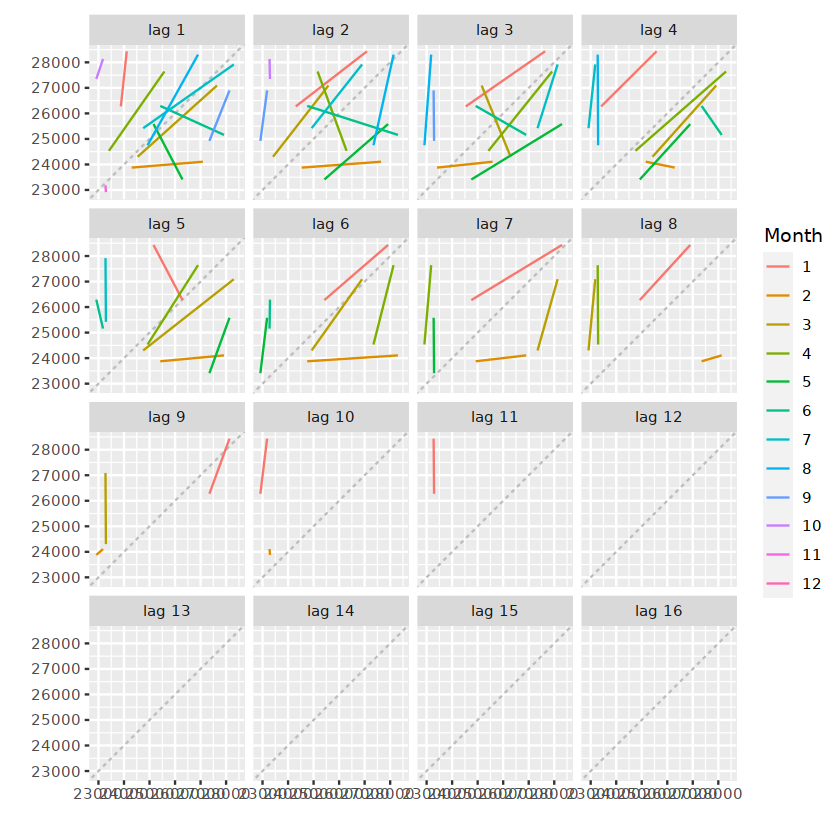

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



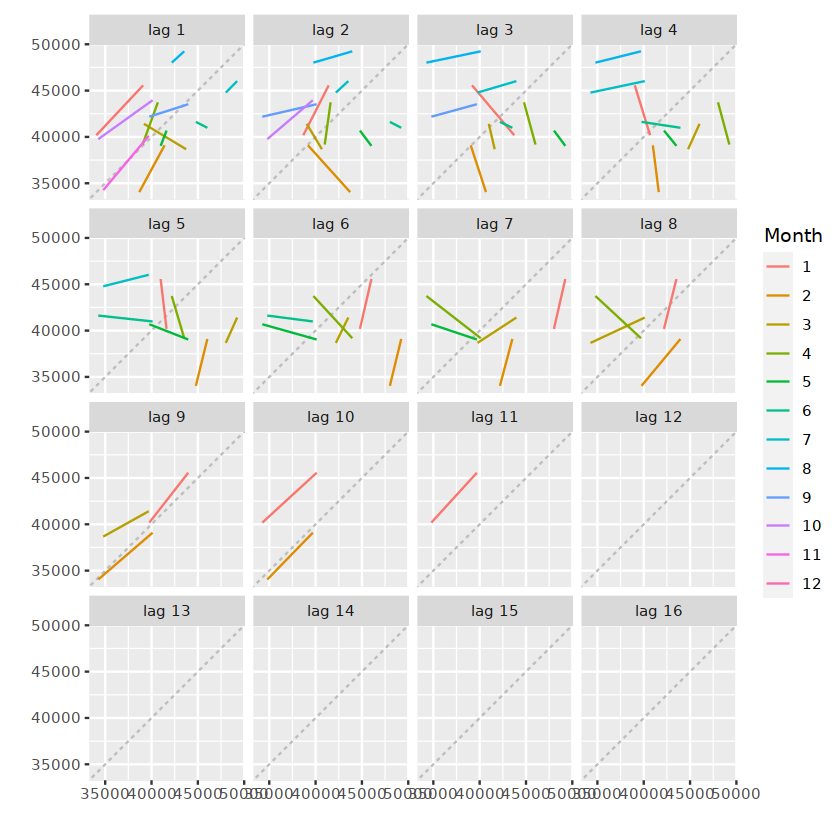

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?



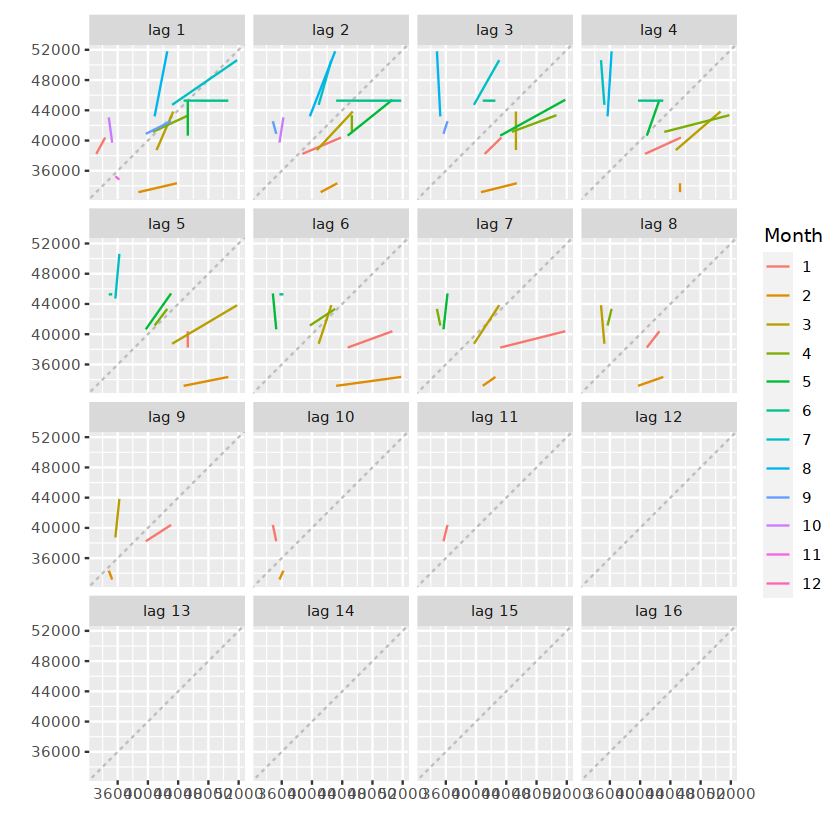

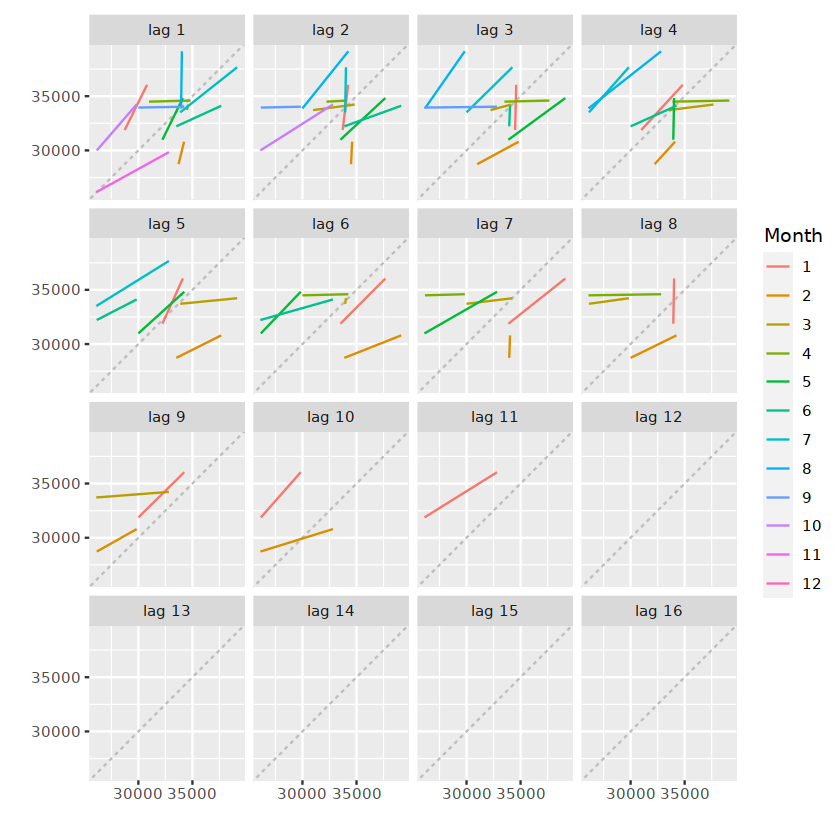

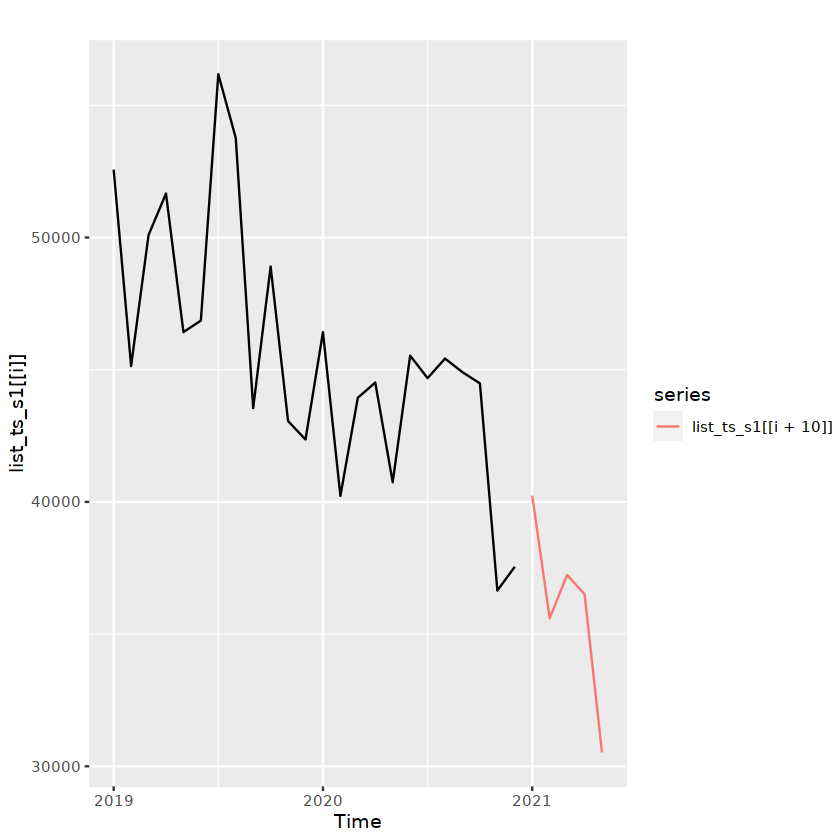

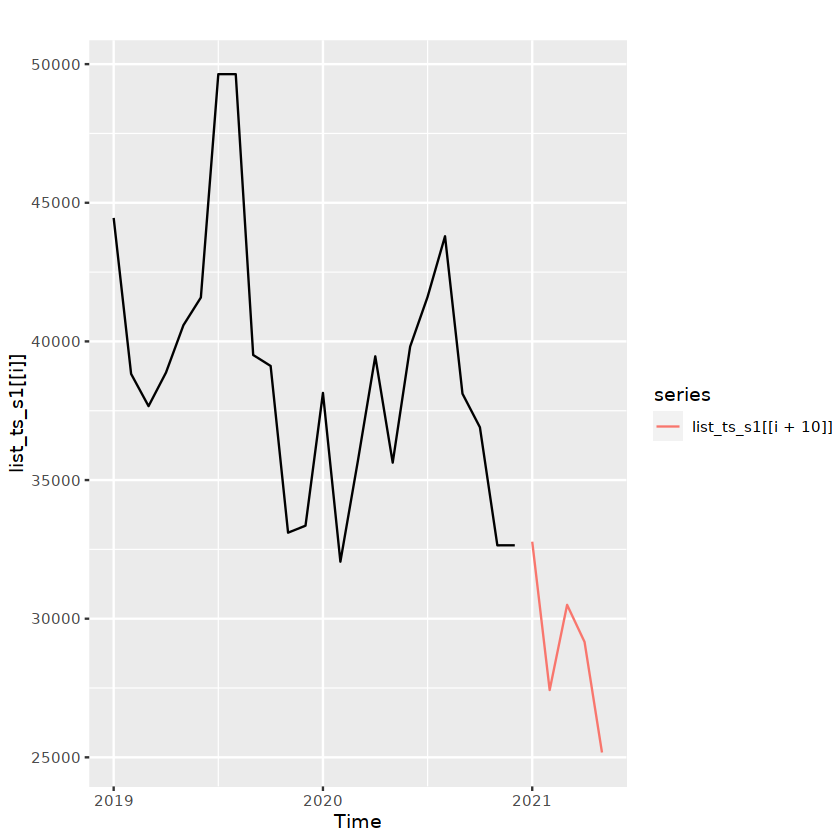

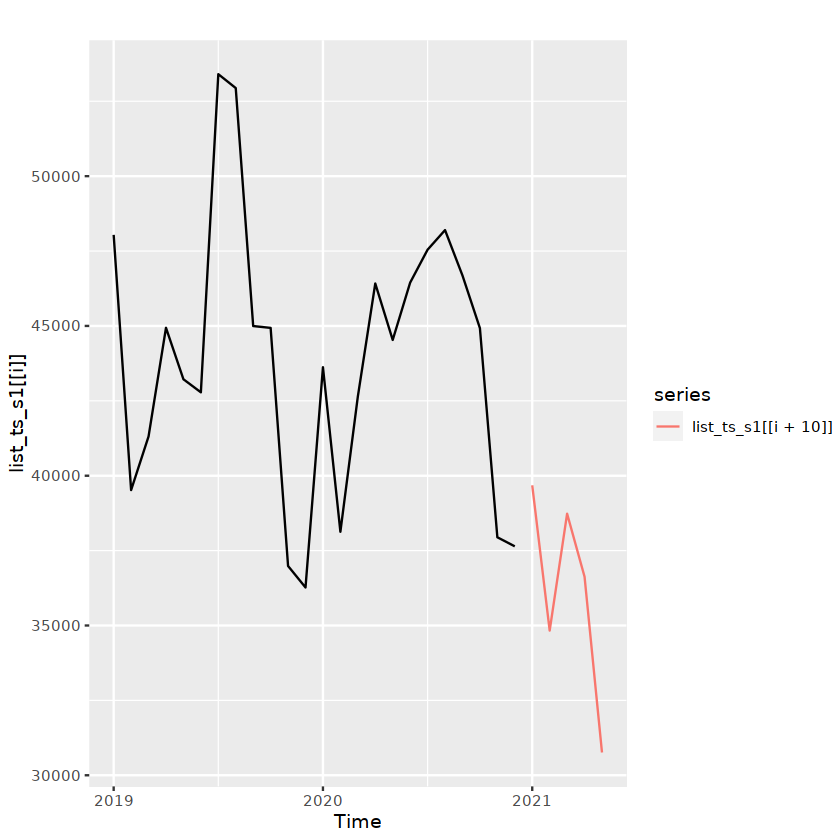

...

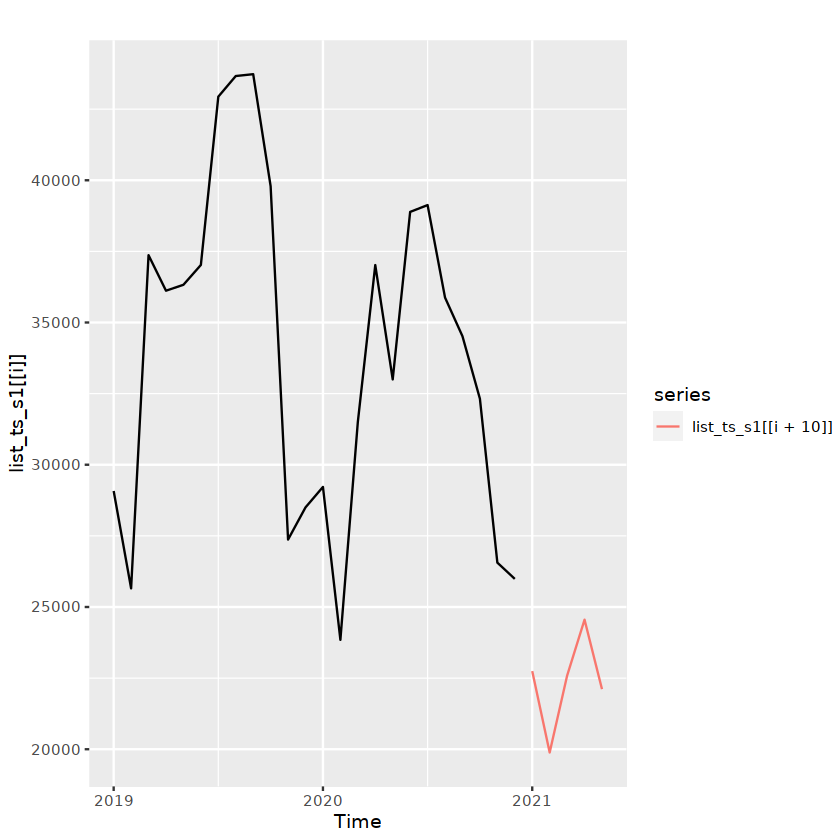

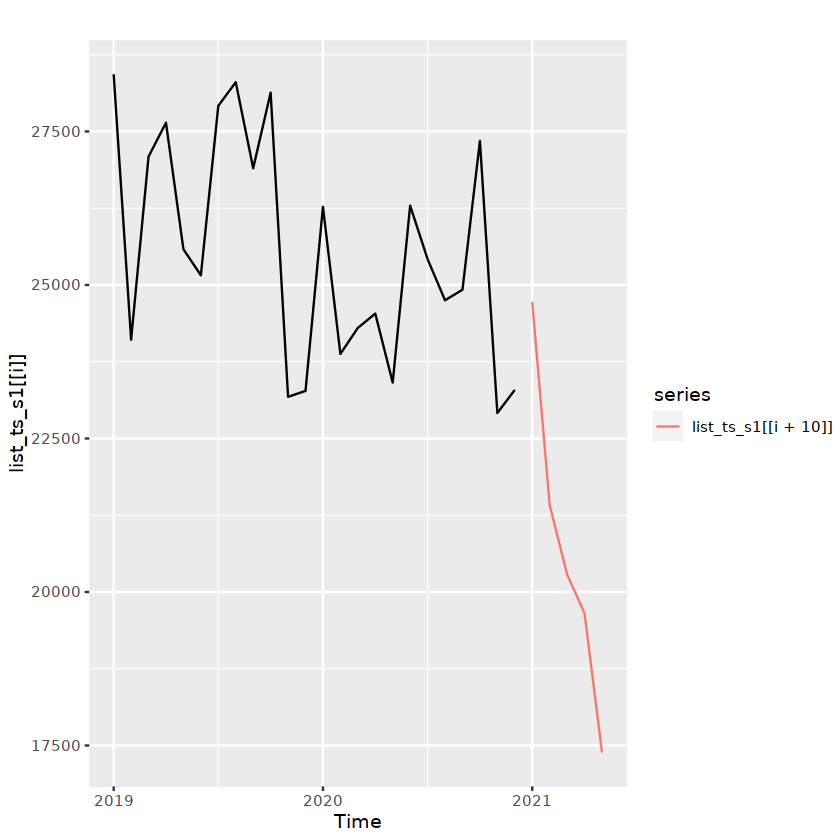

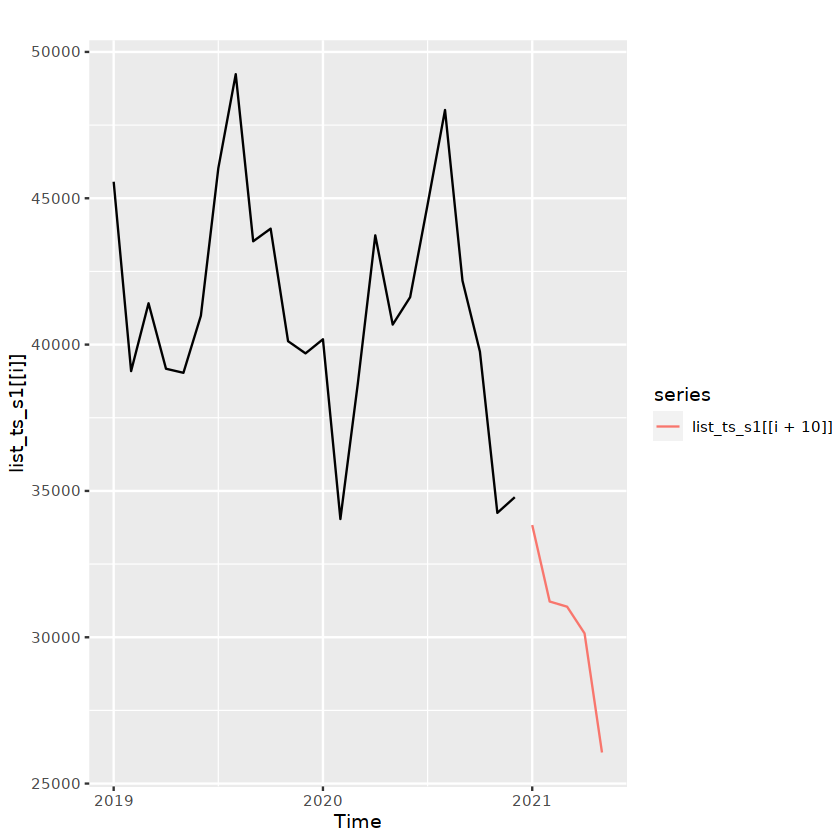

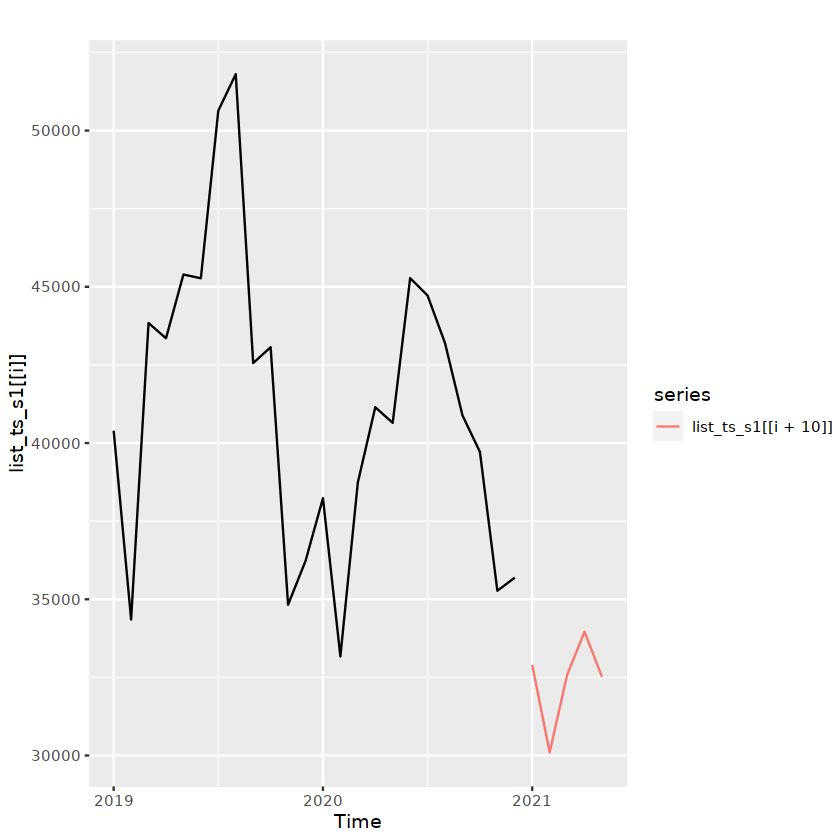

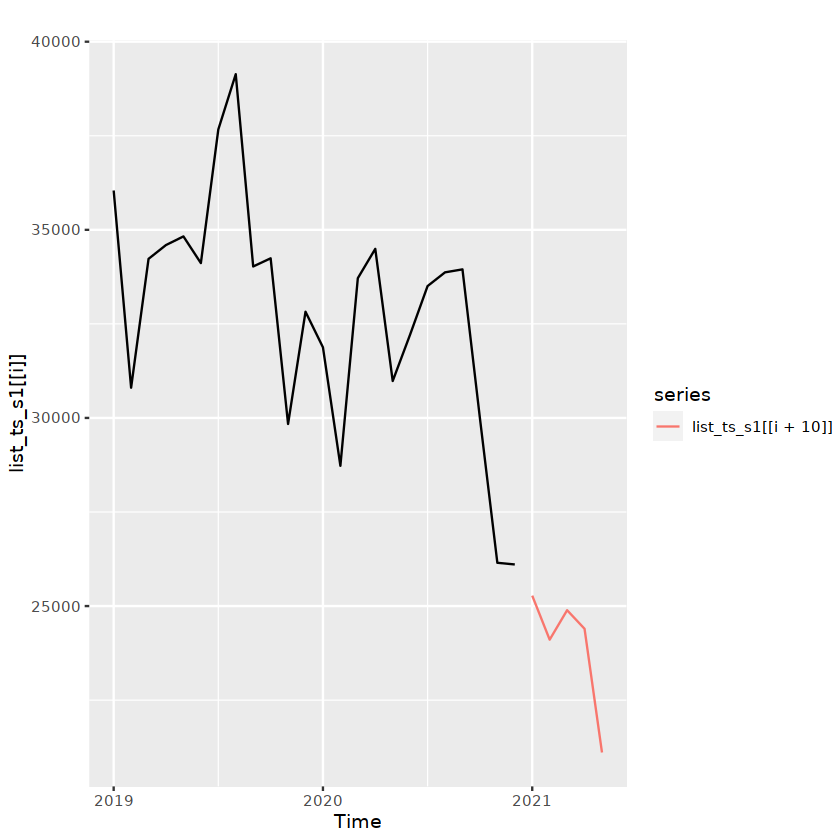

In [7]:
# EDA for scenario1 only

list_long_ts_s1 <- lapply(list_dfs_s1, function(t) ts(t,start=c(2019,1),end=c(2022,12), frequency = 12))
# interactive plots, you can click on the filters for Sub.Products
ggplotly(ggplot(scenario1,aes(x=Date,y=Volumes,color=product_subproduct))+geom_point())

ggplotly(ggplot(scenario1,aes(x=Date,y=Volumes,color=product_subproduct)) +
  geom_line())


for (i in 1:(length(list_long_ts_s1))){
  print(ggseasonplot(list_long_ts_s1[[i]], year.labels=TRUE, year.labels.left=TRUE) +
  ylab("actuals") +
  ggtitle("Seasonal Plot: Training Data"))
}


# plot train only
for (i in 1:(length(list_ts_s1)/2)){
  print(autoplot(list_ts_s1[[i]]))
}

# use moving averages decompose TS -> seasonal, trend, random components
for (i in 1:(length(list_ts_s1)/2)){
  print(ts_decompose(list_ts_s1[[i]]))
}

# training seasonal plot
for (i in 1:(length(list_ts_s1)/2)){
  print(ggseasonplot(list_ts_s1[[i]], year.labels=TRUE, year.labels.left=TRUE) +
  ylab("actuals") +
  ggtitle("Seasonal Plot: Training Data"))
}

# training data lags
for (i in 1:(length(list_ts_s1)/2)){
  print(gglagplot(list_ts_s1[[i]]))
}
      
# Plot training and test together                          
for (i in 1:(length(list_ts_s1)/2)){
  print(autoplot(list_ts_s1[[i]]) +
  autolayer(list_ts_s1[[i+10]]))
}                          

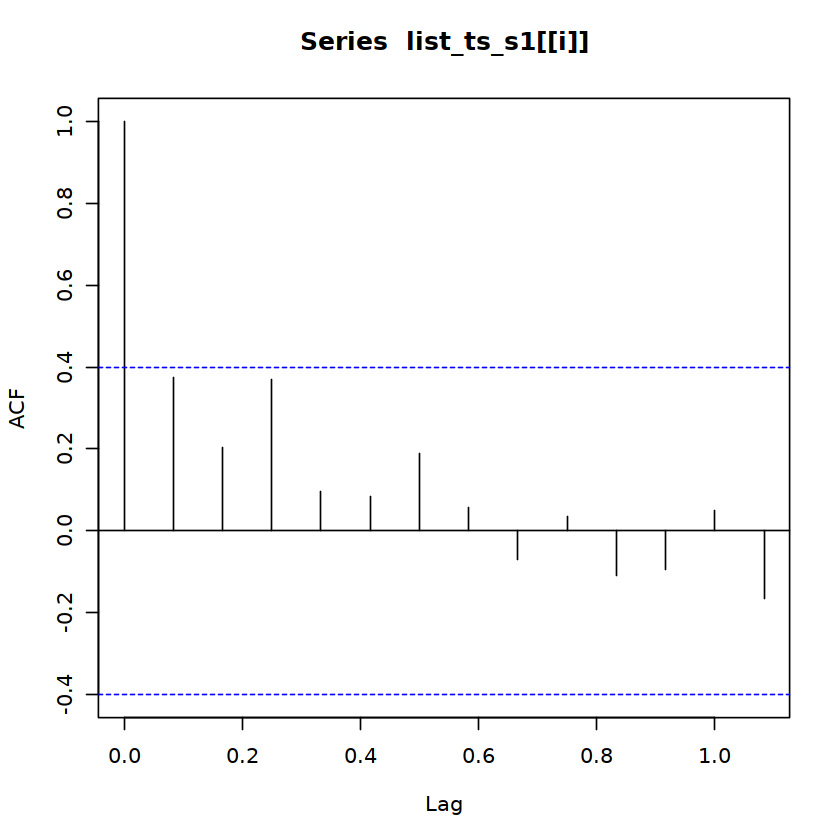

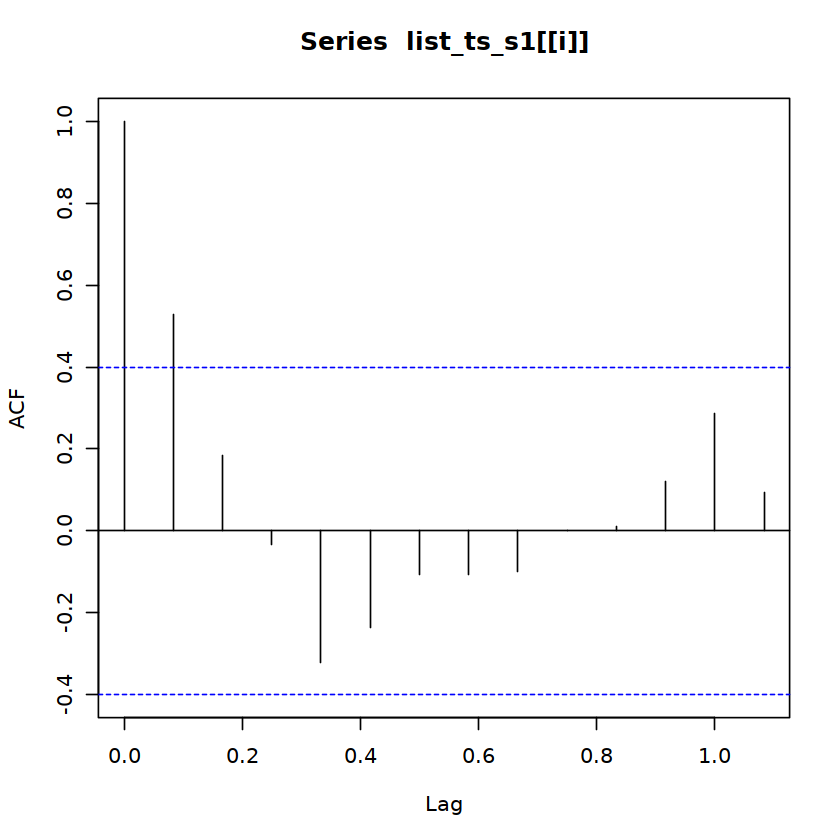

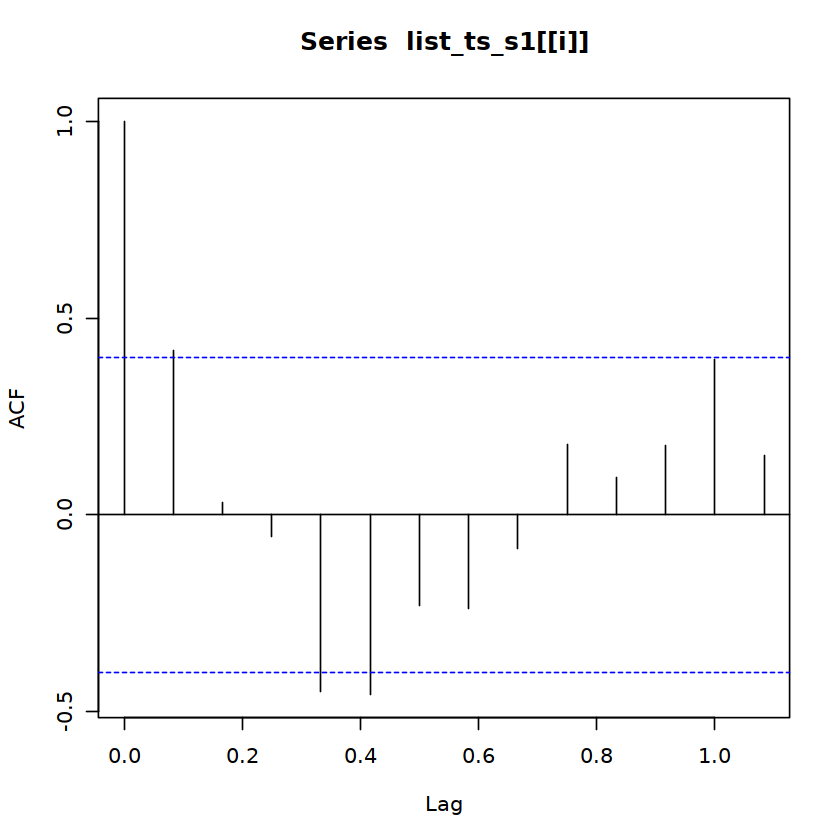

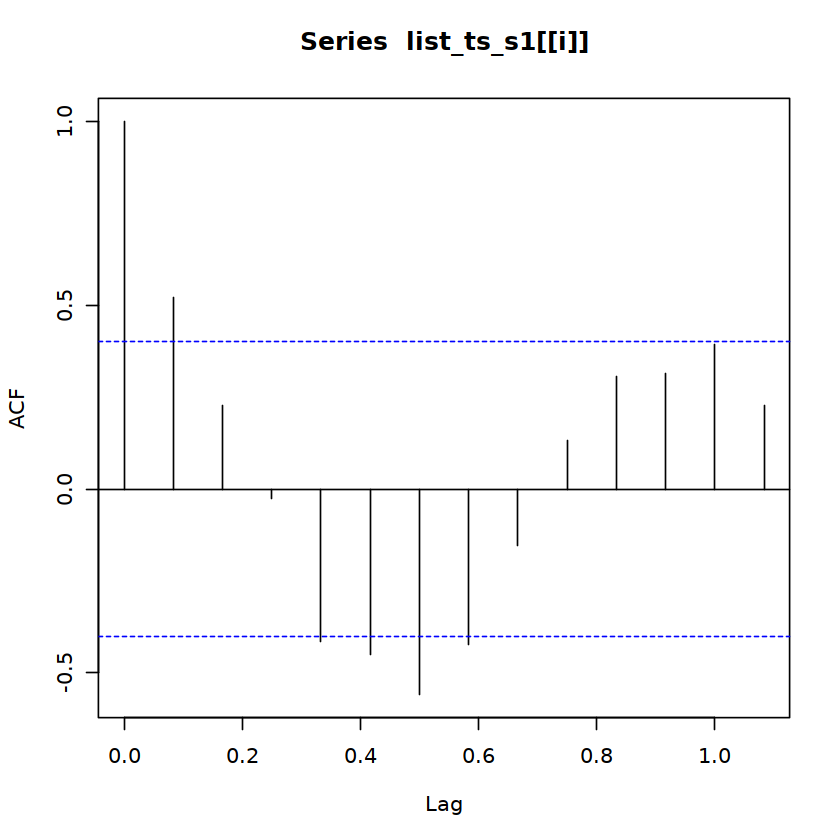

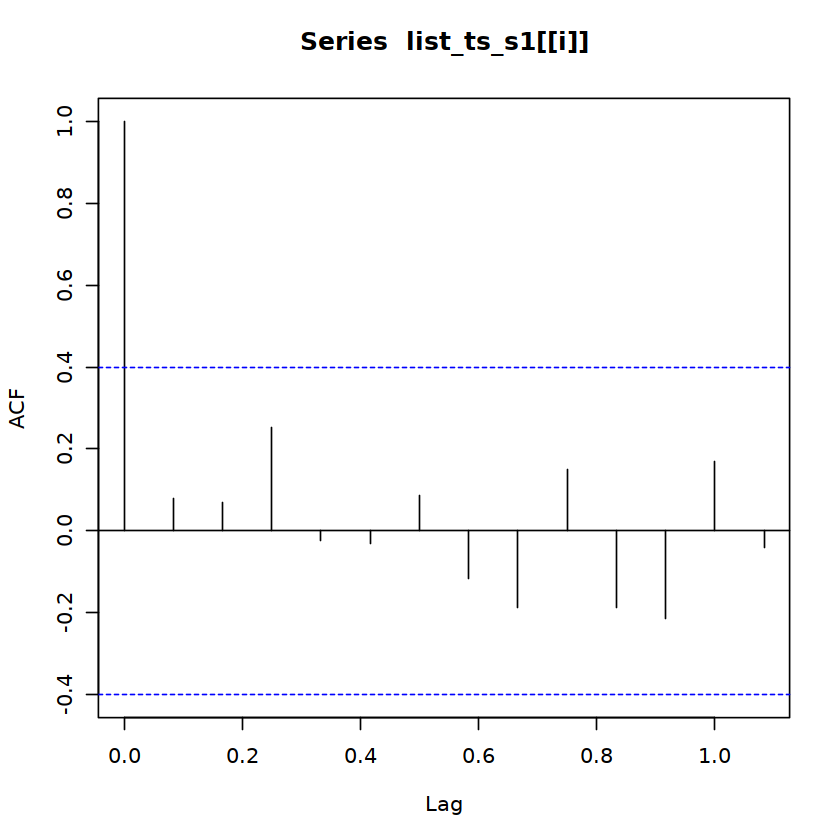

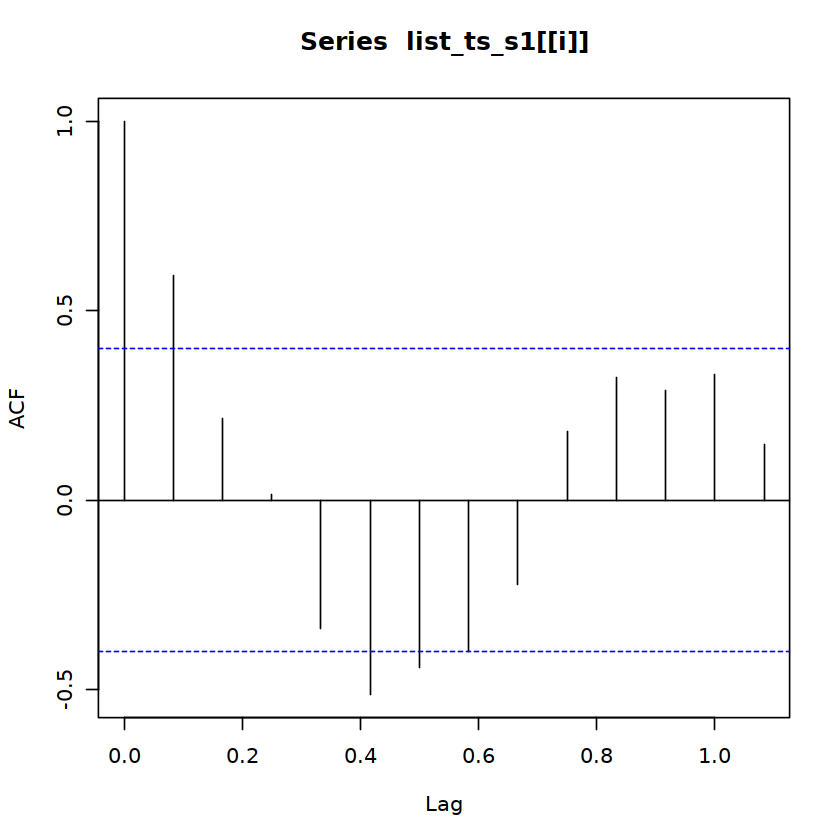

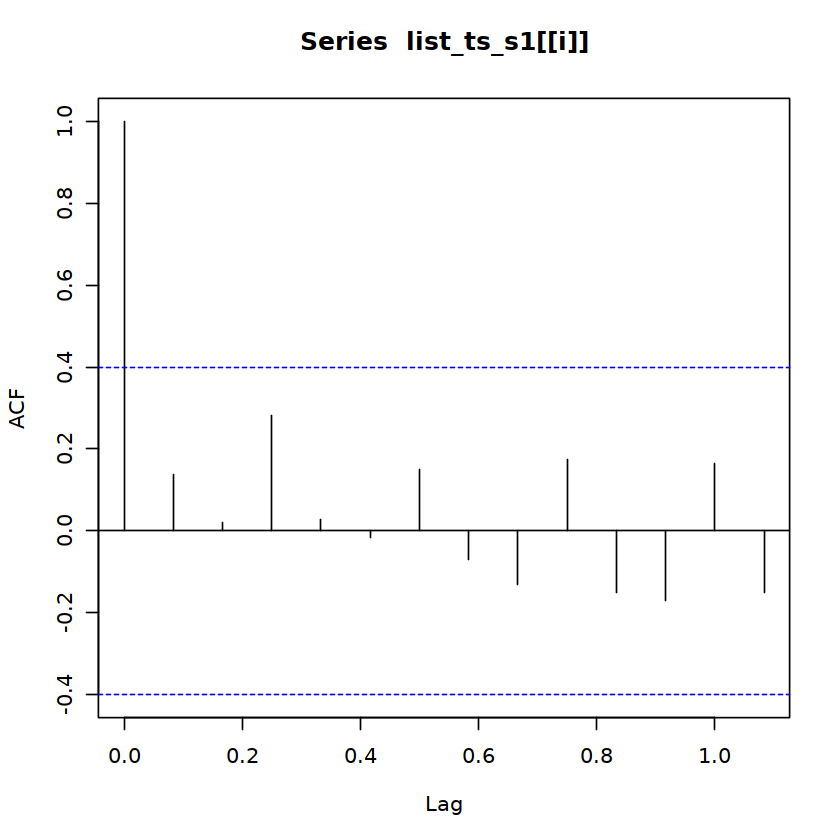

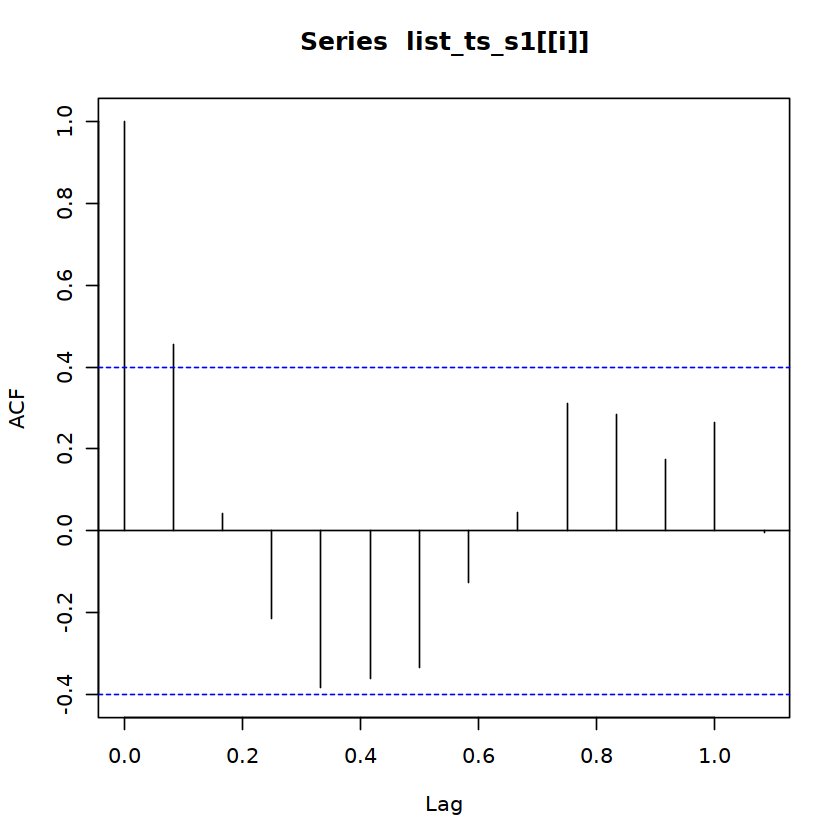

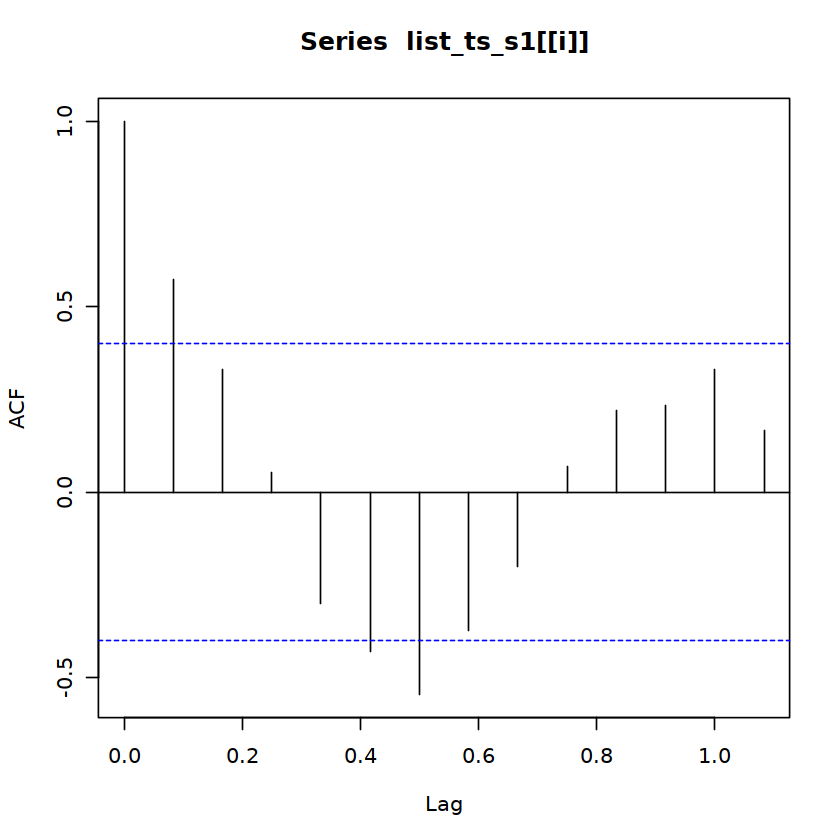


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 3.8193, df = 1, p-value = 0.05067


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 7.5843, df = 1, p-value = 0.005888


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 4.732, df = 1, p-value = 0.02961


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 7.3607, df = 1, p-value = 0.006667


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 0.17291, df = 1, p-value = 0.6775


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 9.5574, df = 1, p-value = 0.001991


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 0.5169, df = 1, p-value = 0.4722


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 5.6026, df = 1, p-value = 0.01793


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 8.9441, df = 1, p-value = 0.002784


	Box-Ljung test

data:  list_ts_s1[[i]]
X-squared = 5.6034, df = 1, p-value = 0.01793



ERROR: Error in adf.test(list_ts_s1[[i]], alternative = "stationary"): could not find function "adf.test"


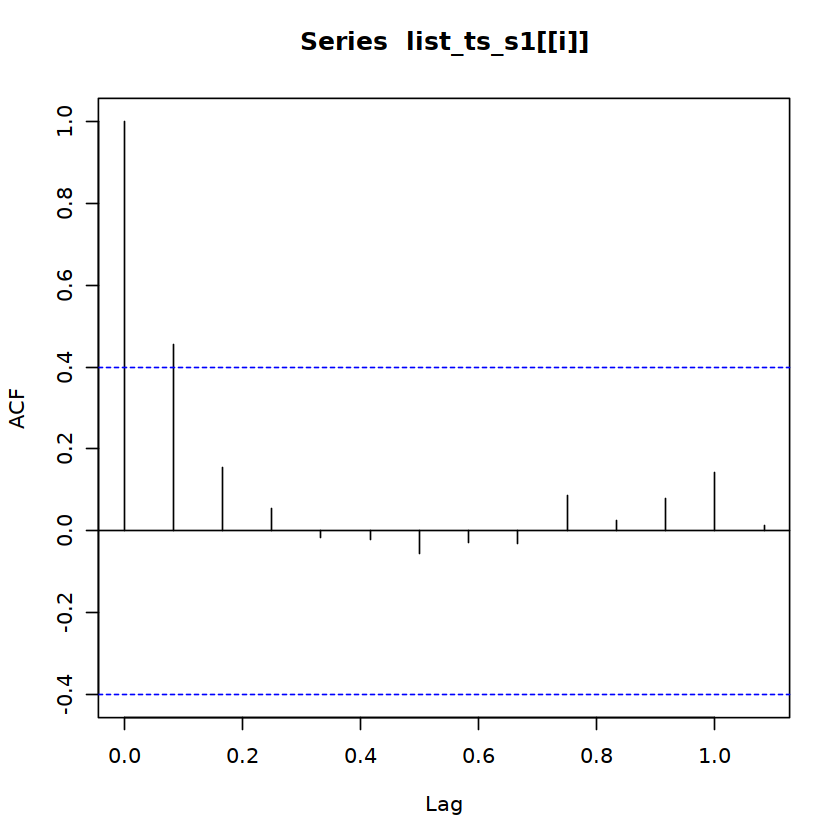

In [8]:
# Stationary Tests

# Checking to see if lags have correlation
for (i in 1:(length(list_ts_s1)/2)){
  acf(list_ts_s1[[i]])
}

# We want higher p-value
for (i in 1:(length(list_ts_s1)/2)){
   print( Box.test(list_ts_s1[[i]],type="Ljung-Box",fitdf = 0))
}

# we want low pvalue < 0.5
for (i in 1:(length(list_ts_s1)/2)){
   print(adf.test(list_ts_s1[[i]],alternative = "stationary"))
}

# We want low pvalue <0.5
for (i in 1:(length(list_ts_s1)/2)){
   print(kpss.test((list_ts_s1[[i]]),null="Trend"))
}

In [ ]:
# Manual SES tuning

alpha <- seq(.01, .99, by = .01)
RMSE <- NA
#best <- vector('list', length(list_ts_s1)/2)


for(i in seq_along(alpha)) {
fit <- ses(list_ts_s1[[4]], alpha = alpha[i], h = 24)
RMSE[i] <- forecast::accuracy(fit,list_ts_s1[[14]])[2,2]}
  

print(RMSE %>% min())
(which.min(RMSE))

In [ ]:
# SES Forecast Results

c1_simple_expo_smooth0 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ses(x,h=24))) 
c1_simple_expo_smooth0 <- lapply(c1_simple_expo_smooth0, "[",  c("mean"))

In [ ]:
# Holt Linear Trend 

c1_add_holtlineartrend <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(holt(x,h=24,phi=0.9)))
c1_add_holtlineartrend <- lapply(c1_add_holtlineartrend, "[",  c("mean"))

c1_add_holtlineartrenddamp <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(holt(x,h=24,damped=TRUE,phi=0.9)))
c1_add_holtlineartrenddamp <- lapply(c1_add_holtlineartrenddamp, "[",  c("mean"))

In [ ]:
# ETS Space Models A= Additive, M= Multiplicative (ERROR,TREND,SEASONALITY)

c1_AAA_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="AAA",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_AAA_ets <- lapply(c1_AAA_ets, "[",  c("mean"))

c1_MAA_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="MAA",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MAA_ets <- lapply(c1_MAA_ets, "[",  c("mean"))

c1_MAM_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="MAM",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MAM_ets <- lapply(c1_MAM_ets, "[",  c("mean"))

c1_MMM_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="MMM",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MMM_ets <- lapply(c1_MMM_ets, "[",  c("mean"))

c1_ANA_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="ANA",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_ANA_ets <- lapply(c1_ANA_ets, "[",  c("mean"))

c1_MNA_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="MNA",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MNA_ets <- lapply(c1_MNA_ets, "[",  c("mean"))

c1_MNM_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="MNM",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MNM_ets <- lapply(c1_MNM_ets, "[",  c("mean"))

c1_AAN_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="AAN",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_AAN_ets <- lapply(c1_AAN_ets, "[",  c("mean"))

c1_MAN_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="MAN",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MAN_ets <- lapply(c1_MAN_ets, "[",  c("mean"))

c1_MMN_ets <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(ets(x,model="MMN",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MMN_ets <- lapply(c1_MMN_ets, "[",  c("mean"))

In [ ]:
# Grid search of HoltWinters... doesn't work in R version 3.6

# hwts <- ts(list_dfs[[3]],start=c(2019,1),end=c(2021,6),frequency=12)

# hw_grid <- ts_grid(hwts, 
#                    model = "HoltWinters",
#                    periods = 2,
#                    window_space = 1,
#                    window_test = 3,
#                    optim = c("RMSE"),
#                    parallel = TRUE,
#                    n.cores = 8,
#                    hyper_params = list(alpha = seq(0.01,1,0.1),
#                                        beta = seq(0.01,1,0.1),
#                                        gamma = seq(0.01,1,0.1)))
# # df1 a,b,g = .101, .001 .9001
# # df2 = .301 .701 0
# # df3 .101 .401 .9001
# # df4  .901 .201 .9001

                                       
# plot_grid(hw_grid, type = "3D")

In [ ]:
# Double Exponential Smoothing HoltWinters

c1_double_holt_additive <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
  forecast::forecast( HoltWinters(x,gamma=FALSE,seasonal="additive"),h=24))

c1_double_holt_additive <- lapply(c1_double_holt_additive, "[",  c("mean"))

In [ ]:
# Triple Exponenetial Smoothing Additive (Many Models, will take time)

n1 <- seq(0.1, 0.99, by = .2)
n2 <- seq(0.1, 0.99, by = .2)
n3 <- seq(0.1, 0.99, by = .29)

dat_n <- expand.grid(n1 = n1, n2= n2, n3 = n3) 
out<- lapply(seq_len(nrow(dat_n)), function(i) {
   c1_triple_holtwinters_additive <- lapply(list_ts_s1[1: 
(length(list_ts_s1)/2)], function(x) 
       forecast::forecast(HoltWinters(x,seasonal = "additive",alpha = 
dat_n$n1[i],beta=dat_n$n2[i],gamma=dat_n$n3[i])))
    c1_triple_holtwinters_additive <- 
 lapply(c1_triple_holtwinters_additive, "[", "mean")
  assign(paste0("c1_triple_holtwinters_additive", i), 
c1_triple_holtwinters_additive, envir = .GlobalEnv)
 c1_triple_holtwinters_additive})


    
c1_triple_holtwinters_additive0 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
  forecast::forecast( HoltWinters(x,seasonal="additive"),h=24))

c1_triple_holtwinters_additive0 <- lapply(c1_triple_holtwinters_additive0, "[",  c("mean"))


In [ ]:
# Triple Exponential Smoothing Multiplicative (Many Models, will take time)

n1 <- seq(0.1, 0.99, by = .2)
n2 <- seq(0.1, 0.99, by = .2)
n3 <- seq(0.1, 0.99, by = .29)

dat_n <- expand.grid(n1 = n1, n2= n2, n3 = n3) 
out<- lapply(seq_len(nrow(dat_n)), function(i) {
   c1_triple_holtwinters_multiplicative <- lapply(list_ts_s1[1: 
(length(list_ts_s1)/2)], function(x) 
       forecast::forecast(HoltWinters(x,seasonal = "multiplicative",alpha = 
dat_n$n1[i],beta=dat_n$n2[i],gamma=dat_n$n3[i])))
    c1_triple_holtwinters_multiplicative <- 
 lapply(c1_triple_holtwinters_multiplicative, "[", "mean")
  assign(paste0("c1_triple_holtwinters_multiplicative", i), 
c1_triple_holtwinters_multiplicative, envir = .GlobalEnv)
 c1_triple_holtwinters_multiplicative})



#
c1_triple_holtwinters_multiplicative0 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
  forecast::forecast( HoltWinters(x,seasonal="multiplicative"),h=24))

c1_triple_holtwinters_multiplicative0 <- lapply(c1_triple_holtwinters_multiplicative0, "[",  c("mean"))

In [ ]:
# Semi-Manual Tuning of ARIMA

# methods <- list(arima1 = list(method = "Arima",
#                               method_arg = list(order = c(0,0,0)),
#                               notes = "ARIMA(0,0,0)"),
#                arima2 = list(method = "Arima",
#                               method_arg = list(order = c(0,0,1)),
#                               notes = "ARIMA(0,0,1)"),
#                 arima3 = list(method = "Arima",
#                               method_arg = list(order = c(0,1,1)),
#                               notes = "ARIMA(0,1,1)"),
#                arima4 = list(method = "Arima",
#                               method_arg = list(order = c(1,1,1)),
#                               notes = "ARIMA(1,1,1)"),
#                 arima5 = list(method = "Arima",
#                               method_arg = list(order = c(1,1,0)),
#                               notes = "ARIMA(1,1,0)"),
#                 arima6 = list(method = "Arima",
#                               method_arg = list(order = c(1,0,0)),
#                               notes = "ARIMA(1,0,0)"),
#                 arima7 = list(method = "Arima",
#                               method_arg = list(order = c(2,1,0)),
#                               notes = "ARIMA(2,1,0)"),
#                 arima8 = list(method = "Arima",
#                               method_arg = list(order = c(2,1,2)),
#                               notes = "ARIMA(2,1,2)"),
#                 arima10 = list(method = "Arima",
#                               method_arg = list(order = c(1,1,3)),
#                               notes = "ARIMA(1,1,3)"),
#                 arima11 = list(method = "Arima",
#                               method_arg = list(order = c(1,0,3)),
#                               notes = "ARIMA(1,0,3)"),
#                 arima12 = list(method = "Arima",
#                               method_arg = list(order = c(2,0,3)),
#                               notes = "ARIMA(2,0,3)"),
#                arima13 = list(method = "Arima",
#                               method_arg = list(order = c(2,1,3)),
#                               notes = "ARIMA(2,1,3)"),
#                 arima14 = list(method = "Arima",
#                               method_arg = list(order = c(2,1,1)),
#                               notes = "ARIMA(2,1,1)"),
#                 arima15 = list(method = "Arima",
#                               method_arg = list(order = c(2,2,2)),
#                               notes = "ARIMA(2,2,2)"),
#                 arima16 = list(method = "Arima",
#                               method_arg = list(order = c(0,1,2)),
#                               notes = "ARIMA(0,1,2)")
#                )
# methods

# md <- train_model(input = list_ts_s1[[1]],
#                   methods = methods,
#                   train_method = list(partitions = 1,
#                                       sample.out = 5,
#                                       space=1),
#                   horizon = 24,
#                   error = "RMSE")

# plot_error(md,error="RMSE")

In [ ]:
# ARIMA models

c1_autoregressive_integratedmovingaverage <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
  forecast::forecast( auto.arima(x,ic=c("aicc")),h=24))

c1_autoregressive_integratedmovingaverage <- lapply(c1_autoregressive_integratedmovingaverage, "[",  c("mean"))



# #2
c1_autoregressive_integratedmovingaverage_1 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
  forecast::forecast( Arima(x,order=c(0,0,0)),ic=c("aicc"),h=24))

c1_autoregressive_integratedmovingaverage_1 <- lapply(c1_autoregressive_integratedmovingaverage_1, "[",  c("mean"))


#3
c1_autoregressive_integratedmovingaverage_2 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
  forecast::forecast( Arima(x,order=c(0,0,1)),h=24))

c1_autoregressive_integratedmovingaverage_2 <- lapply(c1_autoregressive_integratedmovingaverage_2, "[",  c("mean"))

## 4

c1_autoregressive_integratedmovingaverage_3 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
  forecast::forecast( Arima(x,order=c(0,1,1)),h=24))

c1_autoregressive_integratedmovingaverage_3 <- lapply(c1_autoregressive_integratedmovingaverage_3, "[",  c("mean"))

##5

c1_autoregressive_integratedmovingaverage_4 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
  forecast::forecast( Arima(x,order=c(1,0,3)),h=24))

c1_autoregressive_integratedmovingaverage_4 <- lapply(c1_autoregressive_integratedmovingaverage_4, "[",  c("mean"))




## 19
c1_autoregressive_integratedmovingaverage_5 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
  forecast::forecast( Arima(x,order=c(0,1,2)),h=24))

c1_autoregressive_integratedmovingaverage_5 <- lapply(c1_autoregressive_integratedmovingaverage_5, "[",  c("mean"))


In [ ]:
# TSLM season+trend
c1_linearmodel_seasontrend <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
 forecast::forecast(tslm(x~season+trend),h=24))

c1_linearmodel_seasontrend <- lapply(c1_linearmodel_seasontrend, "[",  c("mean"))

# tslm trend
c1_linearmodel_trend <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
 forecast::forecast(tslm(x~trend),h=24))

c1_linearmodel_trend <- lapply(c1_linearmodel_trend, "[",  c("mean"))

In [ ]:
# Cubic Spline
c1_cubicspline1 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::splinef(x,h=24,method=c("mle")))
c1_cubicspline1 <- lapply(c1_cubicspline1, "[",  c("mean"))

c1_cubicspline2 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::splinef(x,h=24,method=c("gcv")))
c1_cubicspline2 <- lapply(c1_cubicspline2, "[",  c("mean"))

In [ ]:
# Dynamic Harmonic Regression
c1_dynamicharmonicregression <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)
 forecast::forecast( auto.arima(x, xreg = fourier(x, K =3),seasonal=FALSE, lambda=NULL)
                     ,xreg=forecast::fourier(x, K=3, h=24)))

c1_dynamicharmonicregression <- lapply(c1_dynamicharmonicregression, "[",  c("mean"))

In [ ]:
# TBATS
c1_boxcoxtransform_armaerrors_trend_seasonal <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(tbats(x),h=24))
c1_boxcoxtransform_armaerrors_trend_seasonal <- lapply(c1_boxcoxtransform_armaerrors_trend_seasonal, "[",  c("mean"))

In [ ]:
# Neural Networks don't work in R version 3.6

# c1_neuralnetwork1 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(nnetar(x,lambda="auto"),h=24))
# c1_neuralnetwork1 <- lapply(c1_neuralnetwork1, "[",  c("mean"))

# c1_neuralnetwork2 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(nnetar(x,lambda="auto",scale.inputs=TRUE),h=24))
# c1_neuralnetwork2 <- lapply(c1_neuralnetwork2, "[",  c("mean"))
# different package nnfor
# c1_neuralnetwork3 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(nnfor::mlp(x),h=24))
# c1_neuralnetwork3 <- lapply(c1_neuralnetwork3, "[",  c("mean"))
# 
# c1_neuralnetwork4 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) forecast::forecast(nnfor::mlp(x,hd=c(10,5)),h=24))
# c1_neuralnetwork4 <- lapply(c1_neuralnetwork4, "[",  c("mean"))
# 
# c1_neuralnetwork5 <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) 
#   forecast::forecast(nnfor::mlp(x,hd=c(10,5),reps=5,comb="mean"),h=24))
# c1_neuralnetwork5 <- lapply(c1_neuralnetwork5, "[",  c("mean"))
# 
# c1_neuralnetwork6<- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x) 
#   forecast::forecast(nnfor::mlp(x,hd=c(10,5),reps=5,comb="mean",sel.lag=TRUE,
#                                 det.type="auto"),h=24))
# c1_neuralnetwork6 <- lapply(c1_neuralnetwork6, "[",  c("mean"))

In [ ]:
# Manual tuning of SARIMA

# d=1
# D=1
# s=4

# for(p in 1:4)
#   {for(q in 1:4)
#     {for(P in 1:4)
#       {for(Q in 1:4)
#         {if(p+d+q+P+D+Q<=10)
#         {model<-forecast::Arima(y=(list_ts_s1[[2]]),order=c(p-1,d,q-1),seasonal=list(order=c(P-1,D,Q-1),period=s))
#         test<-Box.test(model$residuals,lag=log(length(model$residuals)))
#         sse=sum(model$residuals^2)
#         cat(p-1,d,q-1,P-1,D,Q-1, "AICC:",model$aicc,"SSE:",sse,'p-value:',test$p.value,'\n')
  
#         }
#       }
#     }
#   }
# }

In [ ]:
# SARIMA models

n1 <- list(c(0,0,0),c(0,0,1),c(0,1,1),c(1,1,0),c(1,0,3),
            c(1,1,3), c(0,1,2),c(1,1,2),c(2,1,2),c(2,1,3),c(2,2,3))

#n1 <- list(c(0,0,1),c(1,1,1), c(0,1,2),c(1,1,3),c(2,1,1),c(2,1,2),c(1,1,2))
n2 <- list(c(0,1,0),c(1,0,0),c(1,1,0),c(1,1,1),c(0,0,1),c(0,1,1),c(1,0,1))
dat_n <- expand.grid(n1 = n1, n2 = n2)

#
out <- lapply(seq_len(nrow(dat_n)), function(i) {
      c1_sarima <- lapply(list_ts_s1[1:(length(list_ts_s1)/2)], function(x)  {
         tryCatch({forecast::forecast(Arima(x, order = dat_n$n1[[i]],
           seasonal=list(order = dat_n$n2[[i]],
           period=2)),h=24)
           }, error = function(err) return(data.frame(mean = NA_real_))
           
           )})
      
     c1_sarima <- lapply(c1_sarima, "[", "mean")
     c1_sarima <- lapply(c1_sarima, function(x) if(all(is.na(x))) 0 else x)
   assign(paste0("c1_sarima", i), c1_sarima, envir = .GlobalEnv)})

In [ ]:
# Turn all of our model outputs into an exportable format

lst1 <- do.call(Map, c(f = cbind, mget(ls(pattern = 'c1_'))))


export_df1 <- Map(cbind, export_df_s1, lst1)

out <- Map(function(x, y) {x[colnames(y)] <- sapply(y,  function(u) c(rep(0, nrow(x) - length(u)), u)); x}, export_df1, lst1)

export_df1 <- bind_rows(out, .id = "Date")

date <- scenario1$Date

export_df1$Date <- date

export_df1 <- export_df1 %>% separate(product_subproduct, c("Product", "Sub.Product"), "_and_")

In [ ]:
export_df_s2 <- split(scenario2[1:4], scenario2[3])

 # Creation of data frames based off UNIQUE Sub.ProductS 
dummy_list_s2 <- split(scenario2[1:4], scenario2[3]) %>% lapply( function(x) x[(names(x) %in% c("Date", "Volumes"))])
dummy_list_s2 <-  lapply(dummy_list_s2, function(x) { x["Date"] <- NULL; x })

list_dfs_s2 <- list()
for (i in 1:length(unique(scenario2$product_subproduct))) {
  #assign(paste0("df", i), as.data.frame(dummy_list[[i]]))
  list_dfs_s2 <-append(list_dfs_s2,dummy_list_s2[[i]])
}

combined_dfs_s2 <- Reduce(function(x, y) merge(x, y, all = TRUE,  by='Date'), list(list_dfs_s2))

#testing <-lapply(list_dfs, function(x) x[sapply(x, length) < 47])

list_ts_s2 <- lapply(list_dfs_s2, function(t) ts(t,start=c(2019,1),end=c(2021,7), frequency = 12)) %>%
                  lapply( function(t) ts_split(t,sample.out=(7)))    # creates my train test split
list_ts_s2 <- do.call("rbind", list_ts_s2)  #Creates a list of time series


#
c1_simple_expo_smooth0 <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::forecast(ses(x,h=24))) 
c1_simple_expo_smooth0 <- lapply(c1_simple_expo_smooth0, "[",  c("mean"))

c1_add_holtlineartrend <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::forecast(holt(x,h=24,phi=0.9)))
c1_add_holtlineartrend <- lapply(c1_add_holtlineartrend, "[",  c("mean"))

c1_add_holtlineartrenddamp <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::forecast(holt(x,h=24,damped=TRUE,phi=0.9)))
c1_add_holtlineartrenddamp <- lapply(c1_add_holtlineartrenddamp, "[",  c("mean"))

c1_AAA_ets <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::forecast(ets(x,model="AAA",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_AAA_ets <- lapply(c1_AAA_ets, "[",  c("mean"))

c1_MAA_ets <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::forecast(ets(x,model="MAA",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MAA_ets <- lapply(c1_MAA_ets, "[",  c("mean"))

c1_MAM_ets <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::forecast(ets(x,model="MAM",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MAM_ets <- lapply(c1_MAM_ets, "[",  c("mean"))

c1_MMM_ets <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::forecast(ets(x,model="MMM",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MMM_ets <- lapply(c1_MMM_ets, "[",  c("mean"))

c1_ANA_ets <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::forecast(ets(x,model="ANA",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_ANA_ets <- lapply(c1_ANA_ets, "[",  c("mean"))

c1_MNA_ets <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::forecast(ets(x,model="MNA",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MNA_ets <- lapply(c1_MNA_ets, "[",  c("mean"))

c1_MNM_ets <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::forecast(ets(x,model="MNM",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MNM_ets <- lapply(c1_MNM_ets, "[",  c("mean"))

c1_AAN_ets <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::forecast(ets(x,model="AAN",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_AAN_ets <- lapply(c1_AAN_ets, "[",  c("mean"))

c1_MAN_ets <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::forecast(ets(x,model="MAN",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MAN_ets <- lapply(c1_MAN_ets, "[",  c("mean"))

c1_MMN_ets <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::forecast(ets(x,model="MMN",opt.crit=c("mse"),ic=c("aicc")),h=24))
c1_MMN_ets <- lapply(c1_MMN_ets, "[",  c("mean"))

c1_double_holt_additive <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x)
  forecast::forecast( HoltWinters(x,gamma=FALSE,seasonal="additive"),h=24))

c1_double_holt_additive <- lapply(c1_double_holt_additive, "[",  c("mean"))

n1 <- seq(0.1, 0.99, by = .2)
n2 <- seq(0.1, 0.99, by = .2)
n3 <- seq(0.1, 0.99, by = .29)

dat_n <- expand.grid(n1 = n1, n2= n2, n3 = n3) 
out<- lapply(seq_len(nrow(dat_n)), function(i) {
   c1_triple_holtwinters_additive <- lapply(list_ts_s2[1: 
(length(list_ts_s2)/2)], function(x) 
       forecast::forecast(HoltWinters(x,seasonal = "additive",alpha = 
dat_n$n1[i],beta=dat_n$n2[i],gamma=dat_n$n3[i])))
    c1_triple_holtwinters_additive <- 
 lapply(c1_triple_holtwinters_additive, "[", "mean")
  assign(paste0("c1_triple_holtwinters_additive", i), 
c1_triple_holtwinters_additive, envir = .GlobalEnv)
 c1_triple_holtwinters_additive})

c1_triple_holtwinters_additive0 <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x)
  forecast::forecast( HoltWinters(x,seasonal="additive"),h=24))

c1_triple_holtwinters_additive0 <- lapply(c1_triple_holtwinters_additive0, "[",  c("mean"))

n1 <- seq(0.1, 0.99, by = .2)
n2 <- seq(0.1, 0.99, by = .2)
n3 <- seq(0.1, 0.99, by = .29)

dat_n <- expand.grid(n1 = n1, n2= n2, n3 = n3) 
out<- lapply(seq_len(nrow(dat_n)), function(i) {
   c1_triple_holtwinters_multiplicative <- lapply(list_ts_s2[1: 
(length(list_ts_s2)/2)], function(x) 
       forecast::forecast(HoltWinters(x,seasonal = "multiplicative",alpha = 
dat_n$n1[i],beta=dat_n$n2[i],gamma=dat_n$n3[i])))
    c1_triple_holtwinters_multiplicative <- 
 lapply(c1_triple_holtwinters_multiplicative, "[", "mean")
  assign(paste0("c1_triple_holtwinters_multiplicative", i), 
c1_triple_holtwinters_multiplicative, envir = .GlobalEnv)
 c1_triple_holtwinters_multiplicative})

c1_triple_holtwinters_multiplicative0 <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x)
  forecast::forecast( HoltWinters(x,seasonal="multiplicative"),h=24))

c1_triple_holtwinters_multiplicative0 <- lapply(c1_triple_holtwinters_multiplicative0, "[",  c("mean"))

c1_autoregressive_integratedmovingaverage <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x)
  forecast::forecast( auto.arima(x,ic=c("aicc")),h=24))

c1_autoregressive_integratedmovingaverage <- lapply(c1_autoregressive_integratedmovingaverage, "[",  c("mean"))



# #2
c1_autoregressive_integratedmovingaverage_1 <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x)
  forecast::forecast( Arima(x,order=c(0,0,0)),ic=c("aicc"),h=24))

c1_autoregressive_integratedmovingaverage_1 <- lapply(c1_autoregressive_integratedmovingaverage_1, "[",  c("mean"))


#3
c1_autoregressive_integratedmovingaverage_2 <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x)
  forecast::forecast( Arima(x,order=c(0,0,1)),h=24))

c1_autoregressive_integratedmovingaverage_2 <- lapply(c1_autoregressive_integratedmovingaverage_2, "[",  c("mean"))

## 4

c1_autoregressive_integratedmovingaverage_3 <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x)
  forecast::forecast( Arima(x,order=c(0,1,1)),h=24))

c1_autoregressive_integratedmovingaverage_3 <- lapply(c1_autoregressive_integratedmovingaverage_3, "[",  c("mean"))

##5
# non stationary here
c1_autoregressive_integratedmovingaverage_4 <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x)
  forecast::forecast( Arima(x,order=c(1,0,1)),h=24))

c1_autoregressive_integratedmovingaverage_4 <- lapply(c1_autoregressive_integratedmovingaverage_4, "[",  c("mean"))




## 19
c1_autoregressive_integratedmovingaverage_5 <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x)
  forecast::forecast( Arima(x,order=c(0,1,2)),h=24))

c1_autoregressive_integratedmovingaverage_5 <- lapply(c1_autoregressive_integratedmovingaverage_5, "[",  c("mean"))



c1_linearmodel_seasontrend <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x)
 forecast::forecast(tslm(x~season+trend),h=24))

c1_linearmodel_seasontrend <- lapply(c1_linearmodel_seasontrend, "[",  c("mean"))

# tslm trend
c1_linearmodel_trend <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x)
 forecast::forecast(tslm(x~trend),h=24))

c1_linearmodel_trend <- lapply(c1_linearmodel_trend, "[",  c("mean"))

c1_cubicspline1 <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::splinef(x,h=24,method=c("mle")))
c1_cubicspline1 <- lapply(c1_cubicspline1, "[",  c("mean"))

c1_cubicspline2 <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::splinef(x,h=24,method=c("gcv")))
c1_cubicspline2 <- lapply(c1_cubicspline2, "[",  c("mean"))

c1_dynamicharmonicregression <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x)
 forecast::forecast( auto.arima(x, xreg = fourier(x, K =3),seasonal=FALSE, lambda=NULL)
                     ,xreg=forecast::fourier(x, K=3, h=24)))

c1_dynamicharmonicregression <- lapply(c1_dynamicharmonicregression, "[",  c("mean"))

c1_boxcoxtransform_armaerrors_trend_seasonal <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::forecast(tbats(x),h=24))
c1_boxcoxtransform_armaerrors_trend_seasonal <- lapply(c1_boxcoxtransform_armaerrors_trend_seasonal, "[",  c("mean"))

c1_neuralnetwork1 <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::forecast(nnetar(x,lambda="auto"),h=24))
c1_neuralnetwork1 <- lapply(c1_neuralnetwork1, "[",  c("mean"))

c1_neuralnetwork2 <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x) forecast::forecast(nnetar(x,lambda="auto",scale.inputs=TRUE),h=24))
c1_neuralnetwork2 <- lapply(c1_neuralnetwork2, "[",  c("mean"))

n1 <- list(c(0,0,0),c(0,0,1),c(0,1,1),c(1,1,0),c(1,0,3),
            c(1,1,3), c(0,1,2),c(1,1,2),c(2,1,2),c(2,1,3),c(2,2,3))
                            
n2 <- list(c(0,1,0),c(1,0,0),c(1,1,0),c(1,1,1),c(0,0,1),c(0,1,1),c(1,0,1))
dat_n <- expand.grid(n1 = n1, n2 = n2)

#
out <- lapply(seq_len(nrow(dat_n)), function(i) {
      c1_sarima <- lapply(list_ts_s2[1:(length(list_ts_s2)/2)], function(x)  {
         tryCatch({forecast::forecast(Arima(x, order = dat_n$n1[[i]],
           seasonal=list(order = dat_n$n2[[i]],
           period=12)),h=24)
           }, error = function(err) return(data.frame(mean = NA_real_))
           
           )})
      
     c1_sarima <- lapply(c1_sarima, "[", "mean")
     c1_sarima <- lapply(c1_sarima, function(x) if(all(is.na(x))) 0 else x)
   assign(paste0("c1_sarima", i), c1_sarima, envir = .GlobalEnv)})

In [ ]:
lst2 <- do.call(Map, c(f = cbind, mget(ls(pattern = 'c1_'))))

export_df2 <- Map(cbind, export_df_s2, lst2)

out <- Map(function(x, y) {x[colnames(y)] <- sapply(y,  function(u) c(rep(0, nrow(x) - length(u)), u)); x}, export_df2, lst2)

export_df2 <- bind_rows(out, .id = "Date")

date <- scenario2$Date

export_df2$Date <- date

export_df2 <- export_df2 %>% separate(product_subproduct, c("Product", "Sub.Product"), "_and_")

In [ ]:
# Merge our dataframes from scenario1,2,etc and remove columns with values of 0's only

final_df <- rbind(export_df1,export_df2)
 
final_df <- final_df[, colSums(final_df != 0) > 0]

In [ ]:
str(final_df)

In [ ]:
write.csv(final_df,"exportsql.csv", row.names = FALSE)